In [1]:
# !wget https:/vzg-vzg-comerant-datasets.s3.amazonaws.com/comrerant_wheels/cormerant-0.1.4-py3-none-any.whl

# used curl to download to this folder

'wget' is not recognized as an internal or external command,
operable program or batch file.


In [1]:
pwd

'C:\\Users\\DouglasHannumJr\\Desktop\\python_scripts'

In [2]:
# !pip install --use-deprecated=legacy-resolver cormerant-0.1.4-py3-none-any.whl

In [3]:
# !pip install squidpy
# !pip install uninstall -y umap-learn
# !pip install umap-learn
# !pip install --upgrade numba

In [4]:
# !pip install squidpy --user

In [22]:
# !pip install squidpy --user

In [1]:
# import cormerant as cmt
import numpy as np
import pandas as pd
import geopandas as gpd
import scanpy as sc
import squidpy as sq
from math import cos, sin
import os

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\geopandas\_compat.py:123: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
C:\Users\DouglasHannumJr\AppData\Local\Temp\ipykernel_23104\750121876.py:4: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely

In [2]:
import matplotlib.pyplot as plt

In [3]:
adata = sq.read.vizgen(
    '../data/vz-ffpe-showcase/HumanBreastCancerPatient1/',
    counts_file = 'HumanBreastCancerPatient1_cell_by_gene.csv',
    meta_file = 'HumanBreastCancerPatient1_cell_metadata.csv')

In [4]:
adata

AnnData object with n_obs × n_vars = 713121 × 500
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'

In [5]:
adata.obs

,fov,volume,min_x,max_x,min_y,max_y
0,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
713116,NaN,NaN,NaN,NaN,NaN,NaN
713117,NaN,NaN,NaN,NaN,NaN,NaN
713118,NaN,NaN,NaN,NaN,NaN,NaN
713119,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
md = pd.read_csv('../data/vz-ffpe-showcase/HumanBreastCancerPatient1/HumanBreastCancerPatient1_cell_metadata.csv')

In [7]:
md

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,128421,0,547.841519,10996.346206,-211.315228,10991.189362,11001.503050,-215.639293,-206.991164
1,128422,0,291.101510,11103.182359,-209.935477,11099.334599,11107.030118,-213.992957,-205.877997
2,128425,0,489.978098,11007.296582,-209.592749,11002.998782,11011.594381,-213.726745,-205.458754
3,128426,0,654.037717,11106.932047,-207.366062,11100.501938,11113.362156,-212.213345,-202.518779
4,128427,0,861.329942,11061.537618,-205.607113,11055.883233,11067.192004,-211.373308,-199.840918
...,...,...,...,...,...,...,...,...,...
713116,65971,2506,253.298603,10912.734782,9684.140608,10909.369309,10916.100255,9680.283133,9687.998083
713117,65975,2506,1032.868835,10959.600377,9702.129593,10953.184042,10966.016711,9695.970477,9708.288709
713118,65976,2506,623.721435,11058.036588,9703.663795,11050.739990,11065.333187,9696.464221,9710.863369
713119,65983,2506,1236.109249,10944.921726,9740.012287,10937.940486,10951.902966,9733.007135,9747.017439


In [8]:
adata.obs.index

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '713111', '713112', '713113', '713114', '713115', '713116', '713117',
       '713118', '713119', '713120'],
      dtype='object', length=713121)

In [9]:
type(md.index)

pandas.core.indexes.range.RangeIndex

In [10]:
type(md.index[0])

int

In [11]:
adata.obs = md

In [12]:
adata.obs

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,128421,0,547.841519,10996.346206,-211.315228,10991.189362,11001.503050,-215.639293,-206.991164
1,128422,0,291.101510,11103.182359,-209.935477,11099.334599,11107.030118,-213.992957,-205.877997
2,128425,0,489.978098,11007.296582,-209.592749,11002.998782,11011.594381,-213.726745,-205.458754
3,128426,0,654.037717,11106.932047,-207.366062,11100.501938,11113.362156,-212.213345,-202.518779
4,128427,0,861.329942,11061.537618,-205.607113,11055.883233,11067.192004,-211.373308,-199.840918
...,...,...,...,...,...,...,...,...,...
713116,65971,2506,253.298603,10912.734782,9684.140608,10909.369309,10916.100255,9680.283133,9687.998083
713117,65975,2506,1032.868835,10959.600377,9702.129593,10953.184042,10966.016711,9695.970477,9708.288709
713118,65976,2506,623.721435,11058.036588,9703.663795,11050.739990,11065.333187,9696.464221,9710.863369
713119,65983,2506,1236.109249,10944.921726,9740.012287,10937.940486,10951.902966,9733.007135,9747.017439


In [13]:
pairs = np.array(list(zip(md['center_x'].to_numpy(), md['center_y'].to_numpy())))

In [14]:
pairs

array([[10996.34620601,  -211.31522819],
       [11103.18235876,  -209.93547705],
       [11007.29658162,  -209.59274908],
       ...,
       [11058.03658817,  9703.66379522],
       [10944.92172599,  9740.01228737],
       [11073.75060787,  9741.84121064]])

In [15]:
adata.obsm['spatial']

array([[nan, nan],
       [nan, nan],
       [nan, nan],
       ...,
       [nan, nan],
       [nan, nan],
       [nan, nan]])

In [16]:
adata.obsm['spatial'] = pairs

In [17]:
adata.obsm['spatial'].shape

(713121, 2)

In [18]:
adata.obsm['spatial']

array([[10996.34620601,  -211.31522819],
       [11103.18235876,  -209.93547705],
       [11007.29658162,  -209.59274908],
       ...,
       [11058.03658817,  9703.66379522],
       [10944.92172599,  9740.01228737],
       [11073.75060787,  9741.84121064]])

In [19]:
adata.obs

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,128421,0,547.841519,10996.346206,-211.315228,10991.189362,11001.503050,-215.639293,-206.991164
1,128422,0,291.101510,11103.182359,-209.935477,11099.334599,11107.030118,-213.992957,-205.877997
2,128425,0,489.978098,11007.296582,-209.592749,11002.998782,11011.594381,-213.726745,-205.458754
3,128426,0,654.037717,11106.932047,-207.366062,11100.501938,11113.362156,-212.213345,-202.518779
4,128427,0,861.329942,11061.537618,-205.607113,11055.883233,11067.192004,-211.373308,-199.840918
...,...,...,...,...,...,...,...,...,...
713116,65971,2506,253.298603,10912.734782,9684.140608,10909.369309,10916.100255,9680.283133,9687.998083
713117,65975,2506,1032.868835,10959.600377,9702.129593,10953.184042,10966.016711,9695.970477,9708.288709
713118,65976,2506,623.721435,11058.036588,9703.663795,11050.739990,11065.333187,9696.464221,9710.863369
713119,65983,2506,1236.109249,10944.921726,9740.012287,10937.940486,10951.902966,9733.007135,9747.017439


In [20]:
adata.obs['volume']

0          547.841519
1          291.101510
2          489.978098
3          654.037717
4          861.329942
             ...     
713116     253.298603
713117    1032.868835
713118     623.721435
713119    1236.109249
713120     789.034861
Name: volume, Length: 713121, dtype: float64

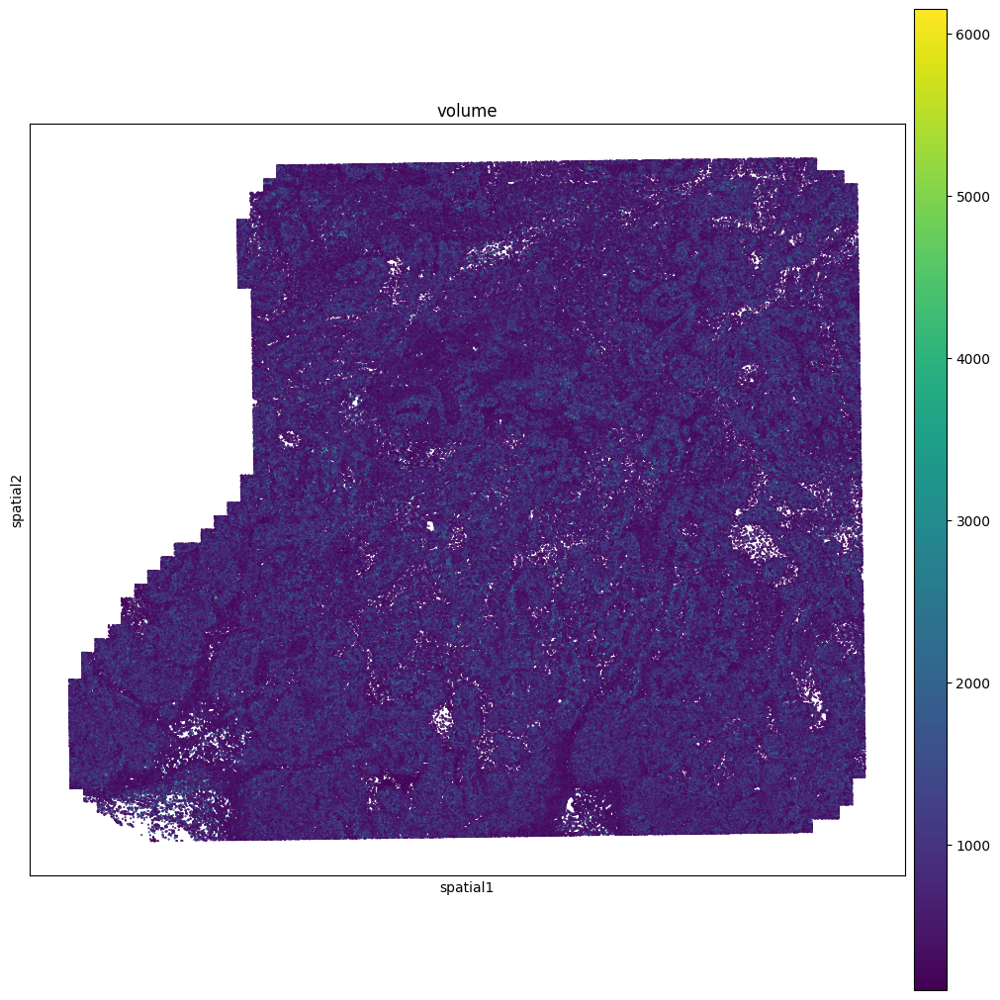

In [21]:
sq.pl.spatial_scatter(
    adata,
    shape=None,
    color="volume",
    size=0.5,
    library_id='spatial',
    figsize=(10, 10), 
)

<function matplotlib.pyplot.show(close=None, block=None)>

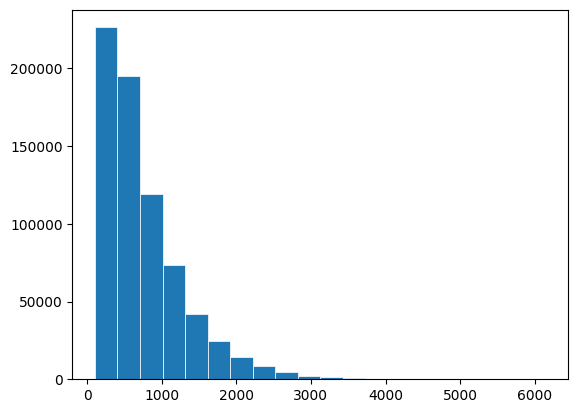

In [22]:
fig, ax = plt.subplots()

ax.hist(adata.obs['volume'], bins = 20, linewidth = 0.5, edgecolor= 'white')
plt.show

In [23]:
adata.obs['log2_volume'] = np.log2(adata.obs['volume'])

<function matplotlib.pyplot.show(close=None, block=None)>

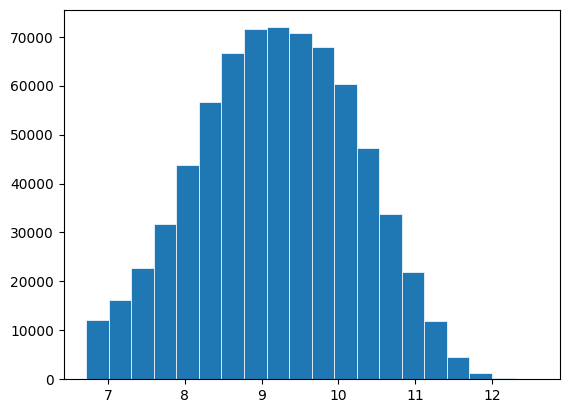

In [24]:
fig, ax = plt.subplots()

ax.hist(adata.obs['log2_volume'], bins = 20, linewidth = 0.5, edgecolor= 'white')
plt.show

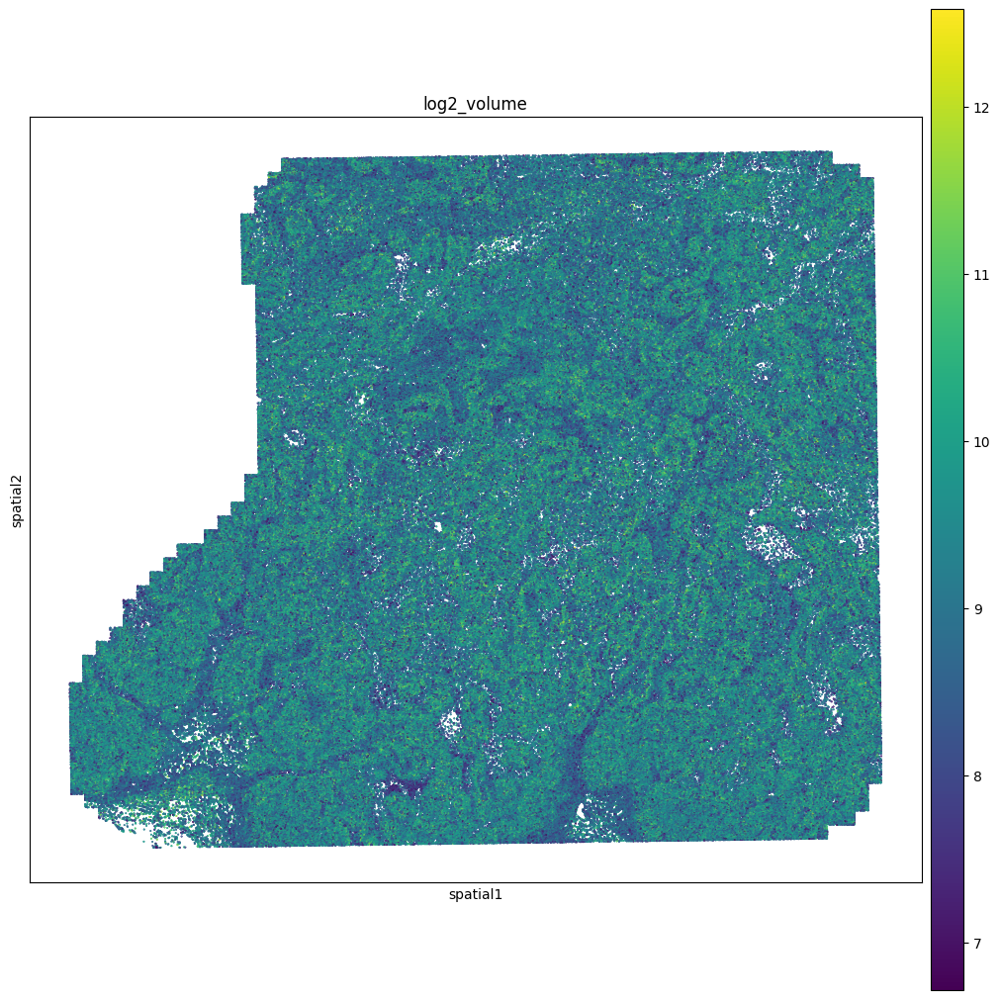

In [25]:
sq.pl.spatial_scatter(
    adata,
    shape=None,
    color="log2_volume",
    size=0.5,
    library_id='spatial',
    figsize=(10, 10), 
)

In [26]:
# help(sq.pl.spatial_scatter)

In [27]:
gene_sum = adata.to_df().apply(sum, 0)

In [28]:
cell_sum = adata.to_df().apply(sum,1)

In [29]:
adata.obs['library_size'] = cell_sum

<function matplotlib.pyplot.show(close=None, block=None)>

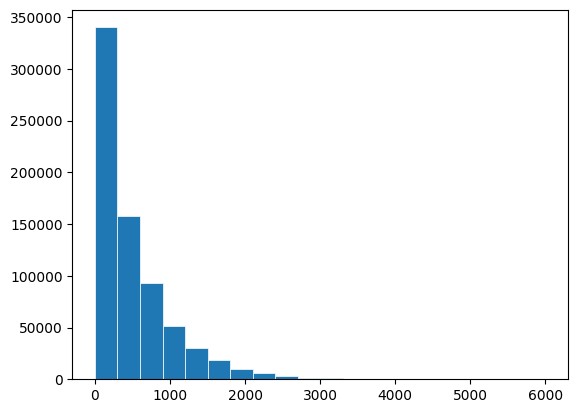

In [30]:
fig, ax = plt.subplots()

ax.hist(adata.obs['library_size'], bins = 20, linewidth = 0.5, edgecolor= 'white')
plt.show

In [31]:
sum(adata.obs['library_size'] == 0)

3048

<function matplotlib.pyplot.show(close=None, block=None)>

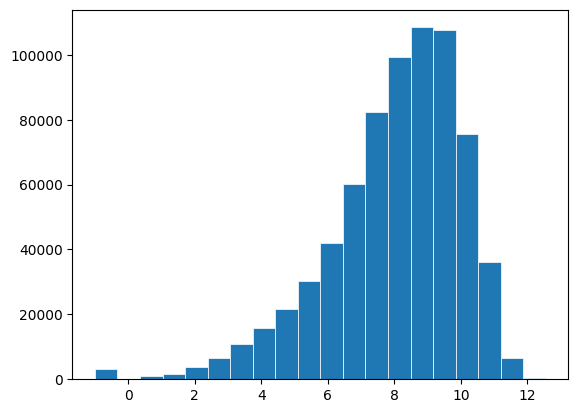

In [32]:
fig, ax = plt.subplots()

ax.hist(np.log2(adata.obs['library_size'] + .5), bins = 20, linewidth = 0.5, edgecolor= 'white')
plt.show

In [33]:
adata.obs['log2_library_size_floor_0.5'] = np.log2(adata.obs['library_size'] + 0.5)

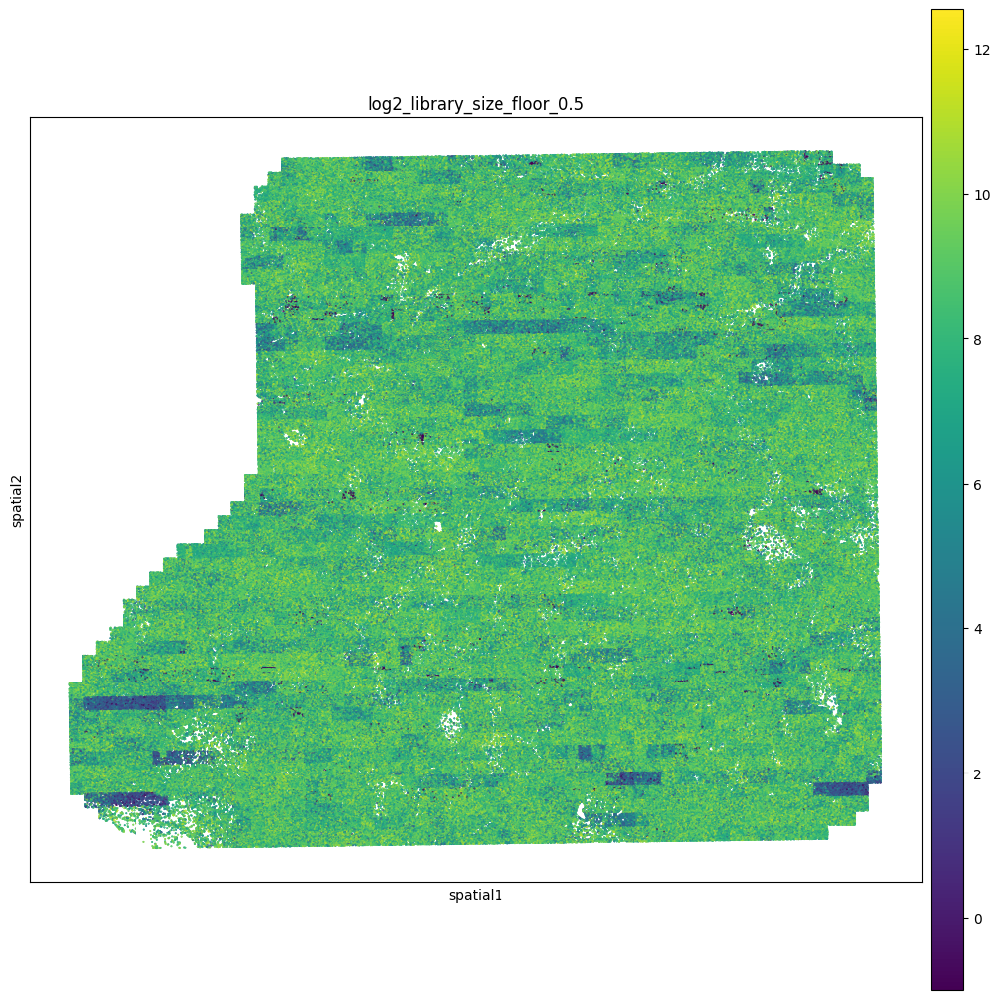

In [34]:
sq.pl.spatial_scatter(
    adata,
    shape=None,
    color="log2_library_size_floor_0.5",
    size=0.5,
    library_id='spatial',
    figsize=(10, 10), 
)

(array([3.9468e+04, 1.8123e+04, 1.0101e+04, 5.8910e+03, 2.8190e+03,
        1.1710e+03, 4.6200e+02, 1.6900e+02, 5.5000e+01, 1.4000e+01]),
 array([  51. ,  271.4,  491.8,  712.2,  932.6, 1153. , 1373.4, 1593.8,
        1814.2, 2034.6, 2255. ]),
 <BarContainer object of 10 artists>)

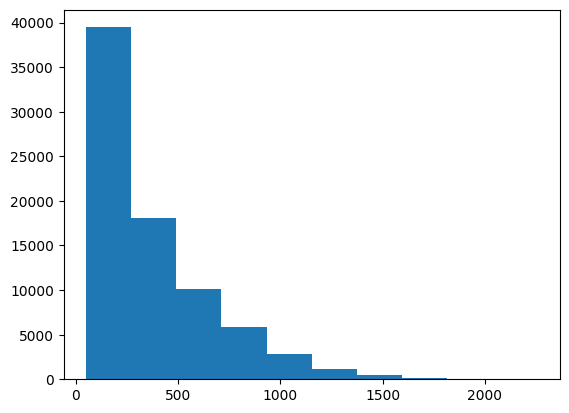

In [22]:
plt.hist(adata.obs['transcript_count'])

In [35]:
adata.var['counts'] = gene_sum

In [36]:
adata.var['var'] = adata.to_df().apply(np.std, 0)

In [37]:
adata.var['log10_counts'] = np.log10(adata.var['counts'])

In [38]:
adata.obs

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,log2_volume,library_size,log2_library_size_floor_0.5
0,128421,0,547.841519,10996.346206,-211.315228,10991.189362,11001.503050,-215.639293,-206.991164,9.097615,2037.0,10.992584
1,128422,0,291.101510,11103.182359,-209.935477,11099.334599,11107.030118,-213.992957,-205.877997,8.185379,294.0,8.202124
2,128425,0,489.978098,11007.296582,-209.592749,11002.998782,11011.594381,-213.726745,-205.458754,8.936573,735.0,9.522582
3,128426,0,654.037717,11106.932047,-207.366062,11100.501938,11113.362156,-212.213345,-202.518779,9.353230,1517.0,10.567481
4,128427,0,861.329942,11061.537618,-205.607113,11055.883233,11067.192004,-211.373308,-199.840918,9.750422,856.0,9.742309
...,...,...,...,...,...,...,...,...,...,...,...,...
713116,65971,2506,253.298603,10912.734782,9684.140608,10909.369309,10916.100255,9680.283133,9687.998083,7.984695,974.0,9.928518
713117,65975,2506,1032.868835,10959.600377,9702.129593,10953.184042,10966.016711,9695.970477,9708.288709,10.012441,503.0,8.975848
713118,65976,2506,623.721435,11058.036588,9703.663795,11050.739990,11065.333187,9696.464221,9710.863369,9.284758,415.0,8.698705
713119,65983,2506,1236.109249,10944.921726,9740.012287,10937.940486,10951.902966,9733.007135,9747.017439,10.271591,543.0,9.086136


In [39]:
# # creating GroupBy object
# group_obj = df.groupby('High')

# # applying the max aggregation function 
# t_df = group_obj.aggregate('max')
# t_df.head(6)

NameError: name 'df' is not defined

In [40]:
group_obs = adata.obs[['fov','library_size','center_x','center_y']].groupby('fov')

In [41]:
fov_lib_size = group_obs.aggregate(['mean',lambda x: np.std(x)])

In [42]:
type(fov_lib_size)

pandas.core.frame.DataFrame

In [43]:
fov_lib_size.columns

MultiIndex([('library_size',       'mean'),
            ('library_size', '<lambda_0>'),
            (    'center_x',       'mean'),
            (    'center_x', '<lambda_0>'),
            (    'center_y',       'mean'),
            (    'center_y', '<lambda_0>')],
           )

In [44]:
fov_lib_size.columns = ['lib_mean','lib_std','x_mean','x_std','y_mean','y_std']

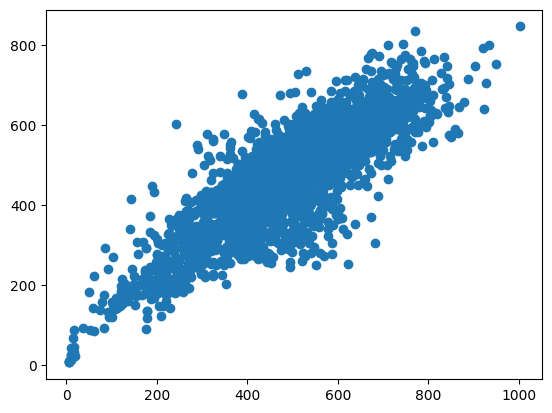

In [45]:
plt.scatter(data=fov_lib_size, x = 'lib_mean', y = 'lib_std')

In [46]:
fov_lib_size['lib_mean_std'] = (fov_lib_size['lib_mean'] - fov_lib_size['lib_mean'].mean()) / fov_lib_size['lib_mean'].std()

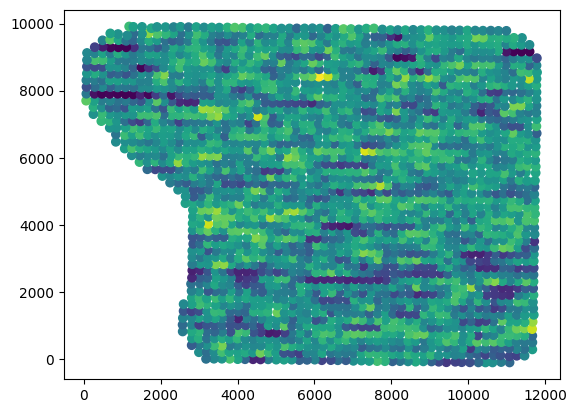

In [47]:
plt.scatter(data = fov_lib_size, x = 'x_mean', y = 'y_mean', c = 'lib_mean_std')

<function matplotlib.pyplot.show(close=None, block=None)>

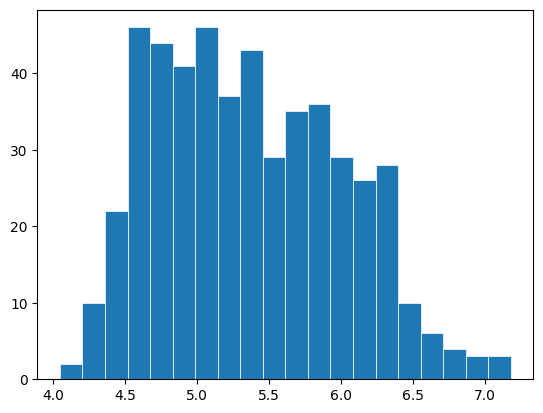

In [48]:
fig, ax = plt.subplots()

ax.hist(adata.var['log10_counts'], bins = 20, linewidth = 0.5, edgecolor= 'white')
plt.show

In [49]:
sum(adata.var['counts'] < 10)

0

In [50]:
sum(adata.obs['library_size'] < 2)

4143

In [51]:
lr_pairs = pd.read_table('../data/human_lr_pair.txt', sep='\t')

In [52]:
adata.var.index

Index(['PDK4', 'CCL26', 'CX3CL1', 'PGLYRP1', 'CD4', 'SNAI2', 'TNFRSF17',
       'ICAM3', 'TBX21', 'FAP',
       ...
       'PDPN', 'IL4', 'TRBC1', 'SERPINA1', 'FGFR2', 'ATM', 'PRF1', 'IL10',
       'IL17A', 'NOTCH1'],
      dtype='object', length=500)

In [53]:
ligands = lr_pairs['ligand_gene_symbol'].unique()

In [54]:
receptors = lr_pairs['receptor_gene_symbol'].unique()

In [55]:
panel_genes = np.array(adata.var.index)

In [56]:
all_pairs = np.concatenate((ligands, receptors))

In [57]:
sum(np.isin(panel_genes, all_pairs))

250

In [58]:
lr_pairs['ligand_present'] = np.isin(lr_pairs['ligand_gene_symbol'],panel_genes)

In [59]:
lr_pairs['receptor_present'] = np.isin(lr_pairs['receptor_gene_symbol'], panel_genes)

In [60]:
lr_pairs['pair_present'] = lr_pairs['ligand_present'] & lr_pairs['receptor_present']

In [61]:
sum(lr_pairs['pair_present'])

278

In [62]:
adata.var['ligand'] = np.isin(adata.var.index, lr_pairs['ligand_gene_symbol'])

In [63]:
adata.var['receptor'] = np.isin(adata.var.index, lr_pairs['receptor_gene_symbol'])

In [64]:
sum(adata.var['ligand'] & adata.var['receptor'])

0

In [65]:
sum(adata.var['ligand'])

119

In [66]:
sum(adata.var['receptor'])

131

In [67]:
adata

AnnData object with n_obs × n_vars = 713121 × 500
    obs: 'Unnamed: 0', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'log2_volume', 'library_size', 'log2_library_size_floor_0.5'
    var: 'counts', 'var', 'log10_counts', 'ligand', 'receptor'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'

In [68]:
sum(adata.var['counts'] < 10)

0

In [69]:
sum(adata.obs['library_size'] < 2)

4143

In [70]:
# upgrade to a simpler index
original_index = adata.obs.index.tolist()
adata.obs['original_index'] = pd.Series(original_index, index = original_index)

new_index = [str(x) for x in list(range(len(original_index)))]
adata.obs.index = new_index
adata.obs_names = adata.obs.index

In [71]:
sc.pp.filter_cells(adata, min_counts=2)

In [72]:
sc.pp.filter_genes(adata, min_cells = 10)

In [73]:
adata

AnnData object with n_obs × n_vars = 708978 × 500
    obs: 'Unnamed: 0', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'log2_volume', 'library_size', 'log2_library_size_floor_0.5', 'original_index', 'n_counts'
    var: 'counts', 'var', 'log10_counts', 'ligand', 'receptor', 'n_cells'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'

In [74]:
adata.layers['raw_counts'] = adata.X.copy()

In [75]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [76]:
adata.layers['log1p_cpm'] = adata.X.copy()

In [77]:
adata.raw = adata

In [78]:
sc.pp.scale(adata, max_value = 10)

In [79]:
# adata.to_df().apply(sum,1)

In [80]:
# help(sc.pp.scale)

In [81]:
np.corrcoef(adata.var['var'], adata.var['std'])

array([[1.        , 0.79136062],
       [0.79136062, 1.        ]])

In [82]:
# help(np.corrcoef)

In [83]:
import scipy.stats

In [84]:
scipy.stats.spearmanr(adata.var['var'], adata.var['std'])

SignificanceResult(statistic=0.9666345865383461, pvalue=1.0134674225582316e-296)

We see a high correlation between the variance with the counts and the ?scaled data output

Dimenstionality Reduction + etc

In [85]:
# help(sc.tl.pca)

In [86]:
sc.tl.pca(adata, svd_solver = 'arpack')

In [87]:
adata.uns['pca']['variance_ratio'][0:9]

array([0.07723564, 0.02820196, 0.02292935, 0.01913423, 0.01461711,
       0.01074252, 0.00745849, 0.00679814, 0.00642585])

In [88]:
range(1,10)

range(1, 10)

In [90]:
# help(sc.pp.neighbors)

In [91]:
sc.pp.neighbors(adata, n_neighbors = 10, n_pcs = 20)

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\umap\distances.py:1086: NumbaDeprecatio

In [92]:
# help(sc.tl.umap)

In [93]:
sc.tl.umap(adata)

In [94]:
adata.obsm['X_umap']

array([[-6.9919653,  6.545928 ],
       [-2.3144002,  6.439831 ],
       [-1.5487791, -0.2794505],
       ...,
       [-6.815048 ,  7.4432597],
       [-6.4323626,  2.059076 ],
       [ 6.733141 , 12.267481 ]], dtype=float32)

In [95]:
# help(sc.tl.leiden)

In [96]:
adata

AnnData object with n_obs × n_vars = 708978 × 500
    obs: 'Unnamed: 0', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'log2_volume', 'library_size', 'log2_library_size_floor_0.5', 'original_index', 'n_counts'
    var: 'counts', 'var', 'log10_counts', 'ligand', 'receptor', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'umap'
    obsm: 'blank_genes', 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'log1p_cpm'
    obsp: 'distances', 'connectivities'

In [97]:
adata.obs.shape

(708978, 14)

In [98]:
adata.shape

(708978, 500)

In [99]:
# sc.tl.leiden wouldn't work difference in length of edges and weights
# found online it may be an issue with igraph so loaded an older version of igraph:
# https://github.com/scverse/scanpy/issues/2339
# pip install igraph==0.9.9

In [100]:
# help(sc.tl.louvain)

%time sc.tl.leiden(adata)

CPU times: total: 16min 38s
Wall time: 16min 51s


In [101]:
adata

AnnData object with n_obs × n_vars = 708978 × 500
    obs: 'Unnamed: 0', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'log2_volume', 'library_size', 'log2_library_size_floor_0.5', 'original_index', 'n_counts', 'leiden'
    var: 'counts', 'var', 'log10_counts', 'ligand', 'receptor', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'blank_genes', 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'log1p_cpm'
    obsp: 'distances', 'connectivities'

In [102]:
from collections import Counter

In [103]:
Counter(adata.obs['leiden'])

Counter({'4': 60238,
         '6': 56259,
         '0': 87028,
         '1': 83670,
         '8': 45771,
         '2': 63174,
         '3': 60733,
         '13': 7230,
         '10': 35333,
         '9': 37079,
         '7': 47251,
         '5': 60161,
         '11': 30762,
         '12': 28525,
         '15': 554,
         '14': 5210})

In [104]:
df = pd.DataFrame.from_dict(Counter(adata.obs['leiden']), orient='index').reset_index()

In [105]:
df.columns

Index(['index', 0], dtype='object')

In [106]:
type(df['index'])

pandas.core.series.Series

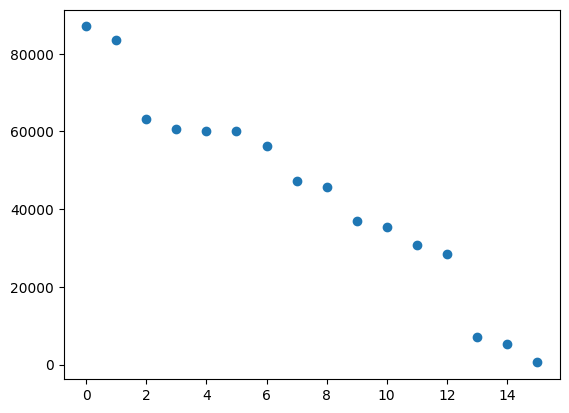

In [107]:
plt.scatter(x = pd.to_numeric(df['index']), y = df[0])

In [108]:
cell_by_gene = adata.to_df()

In [109]:
cell_by_gene.shape

(708978, 500)

Visualizations

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


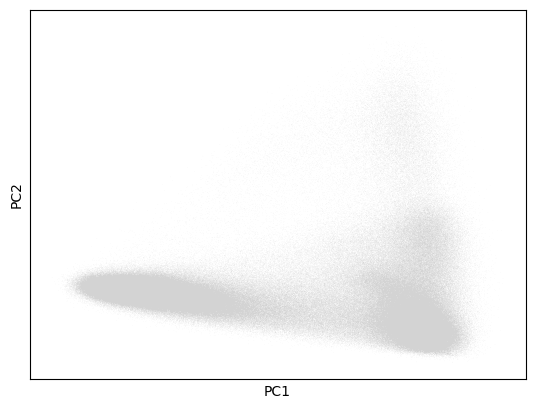

In [110]:
sc.pl.pca(adata)

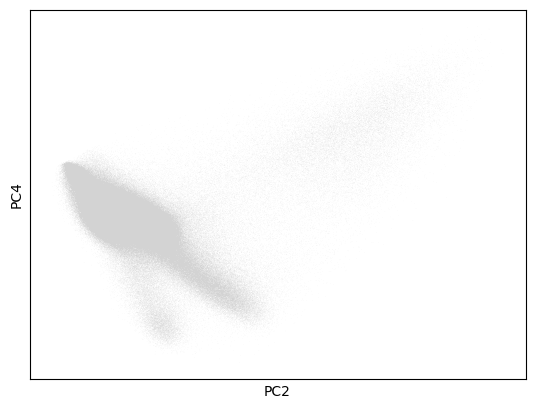

In [111]:
sc.pl.pca(adata, dimensions=[1,3])

In [112]:
# help(sc.pl.pca)

In [113]:
adata

AnnData object with n_obs × n_vars = 708978 × 500
    obs: 'Unnamed: 0', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'log2_volume', 'library_size', 'log2_library_size_floor_0.5', 'original_index', 'n_counts', 'leiden'
    var: 'counts', 'var', 'log10_counts', 'ligand', 'receptor', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'blank_genes', 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'log1p_cpm'
    obsp: 'distances', 'connectivities'

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


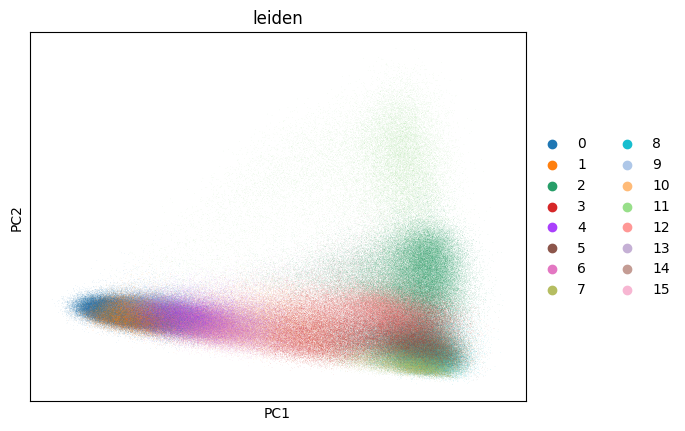

In [114]:
sc.pl.pca(adata, color = 'leiden')

In [115]:
adata.uns['leiden_colors']

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2']

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


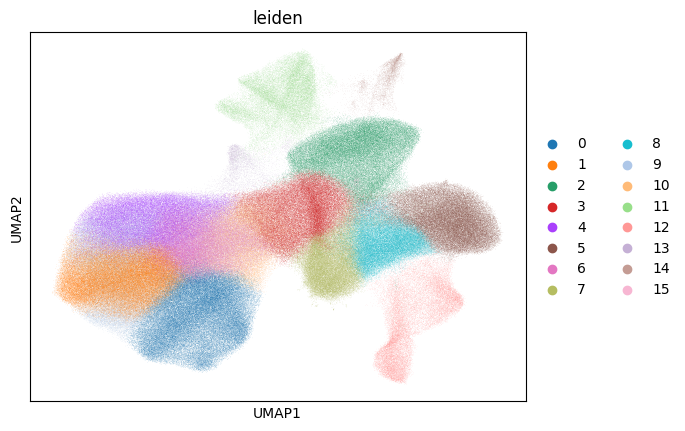

In [116]:
sc.pl.umap(adata, color = 'leiden')

In [117]:
adata.uns['leiden_colors_og'] = ['#1f77b4',
 '#ff7f0e',
 '#2ca02c',
 '#d62728',
 '#9467bd',
 '#8c564b',
 '#e377c2',
 '#7f7f7f',
 '#bcbd22',
 '#17becf',
 '#1f77b4',
 '#ff7f0e',
 '#2ca02c',
 '#d62728',
 '#9467bd',
 '#8c564b',
 '#e377c2',
 '#7f7f7f',
 '#bcbd22']

0


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


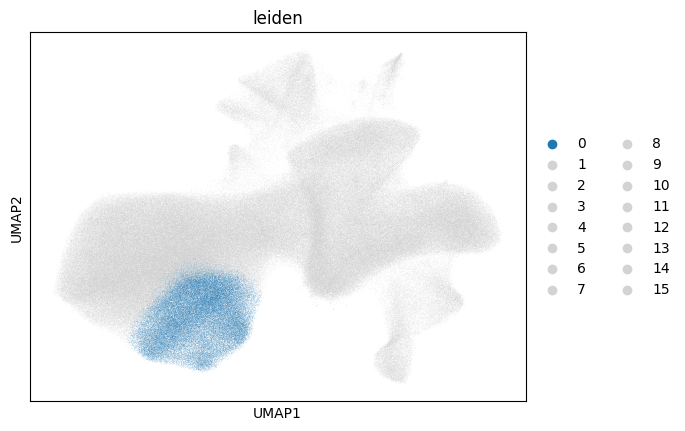

1


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


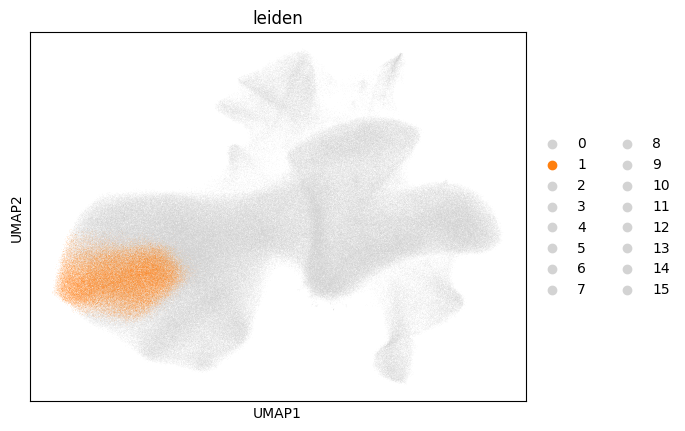

2


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


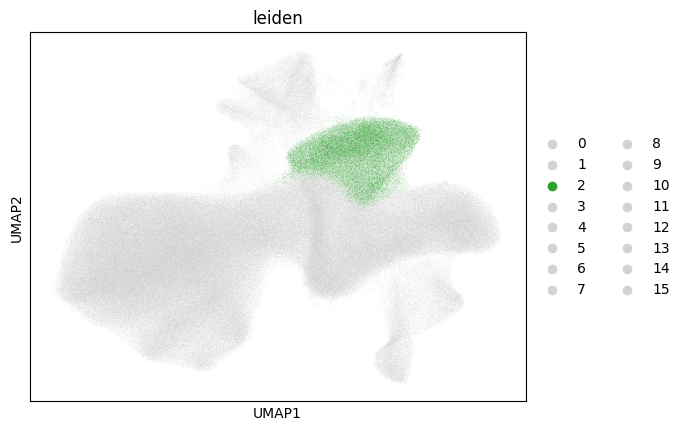

3


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


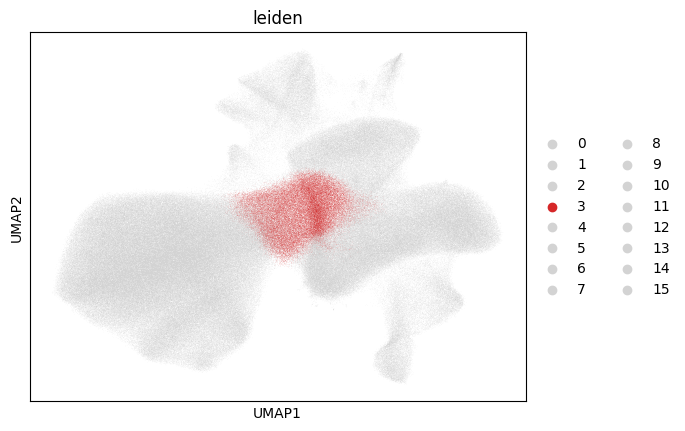

4


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


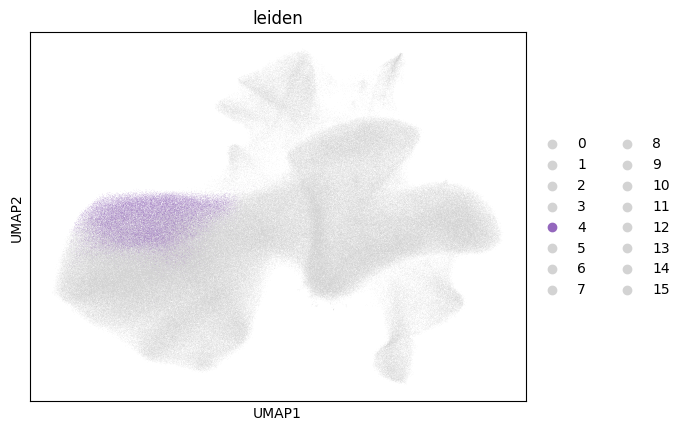

5


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


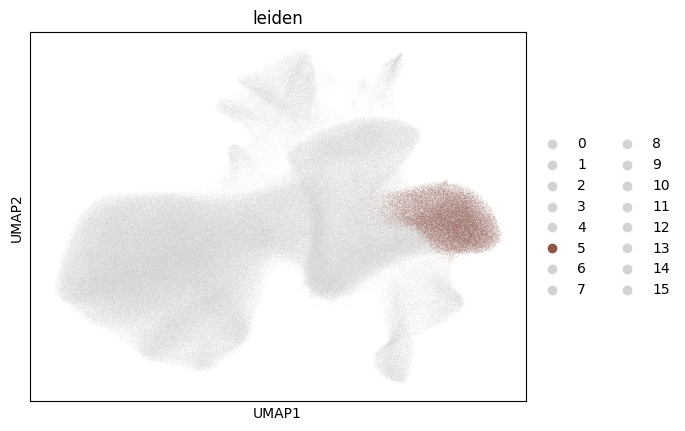

6


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


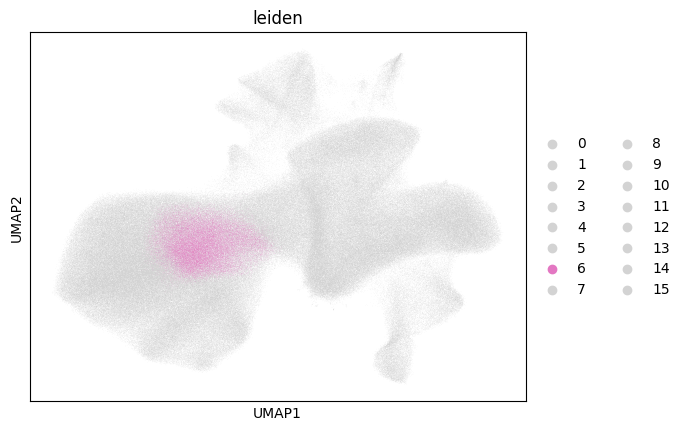

7


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


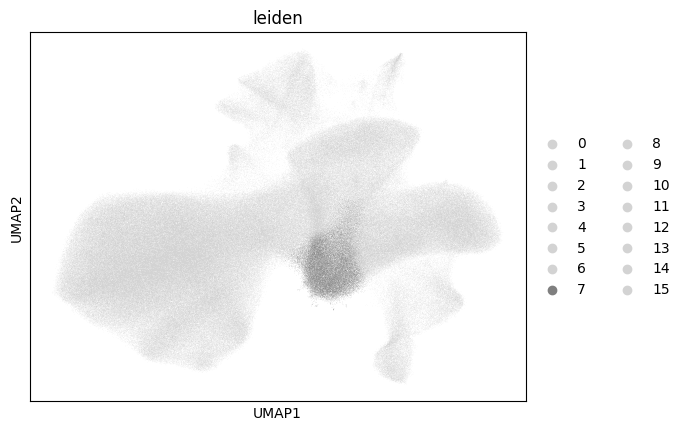

8


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


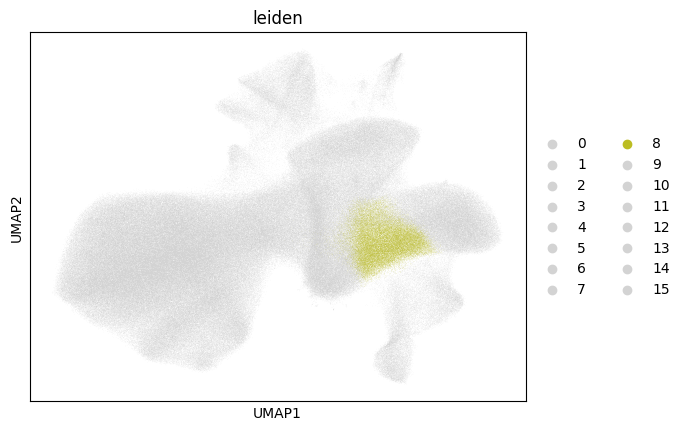

9


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


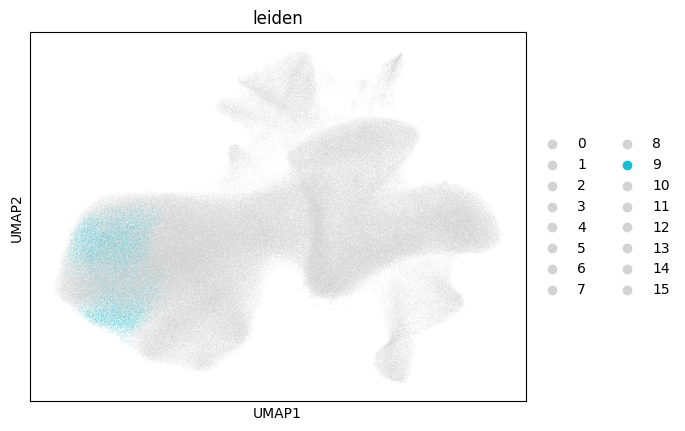

10


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


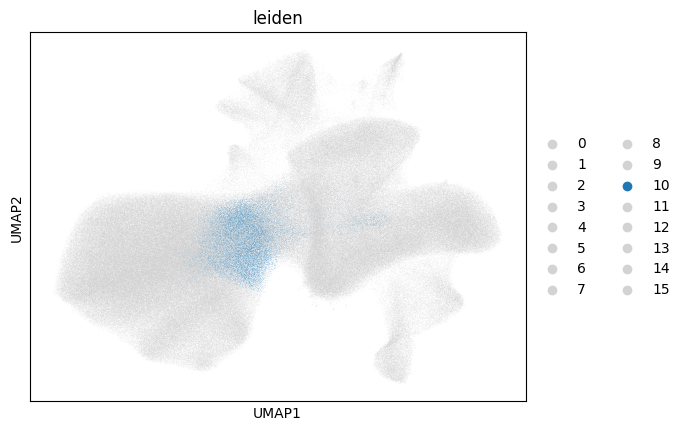

11


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


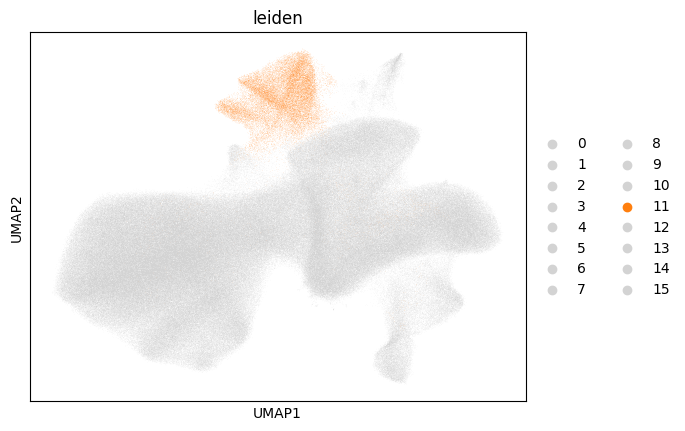

12


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


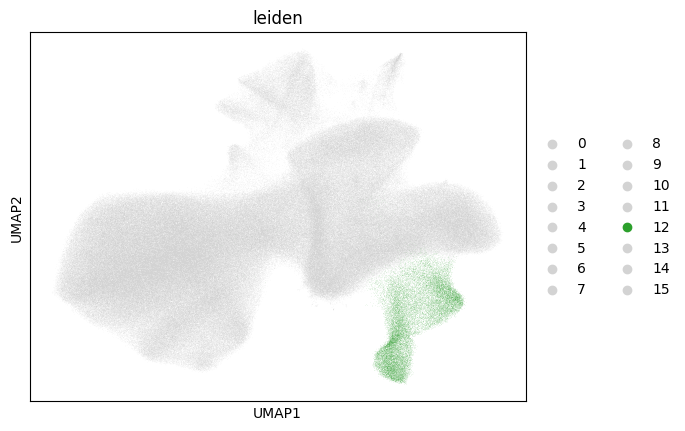

13


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


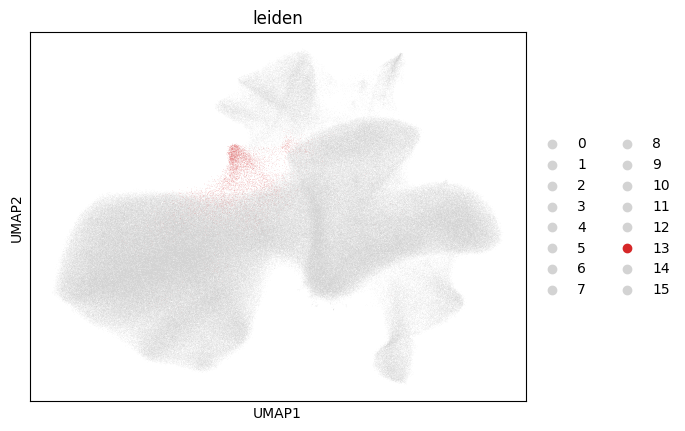

14


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


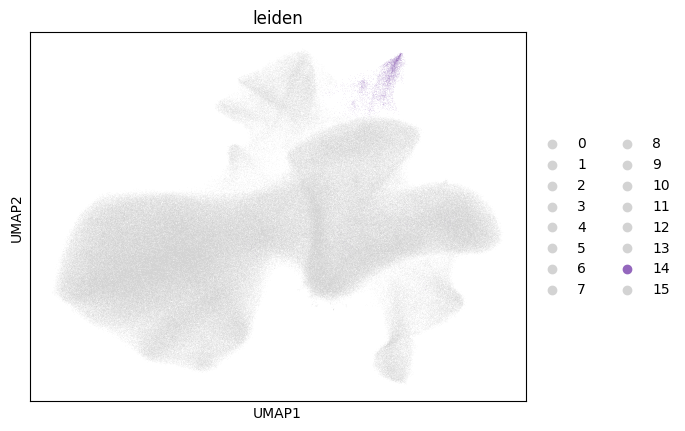

15


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


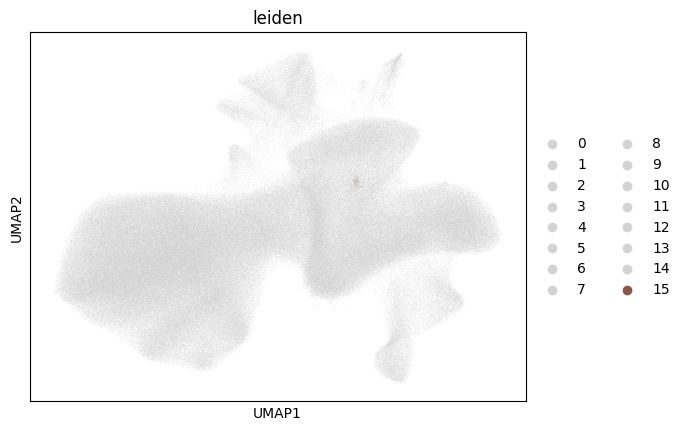

16


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


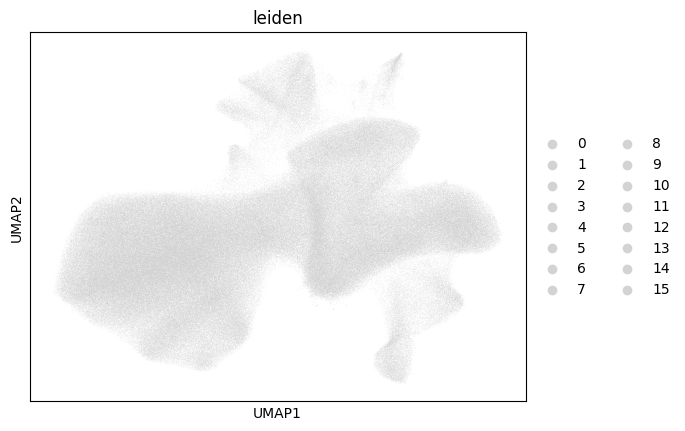

17


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


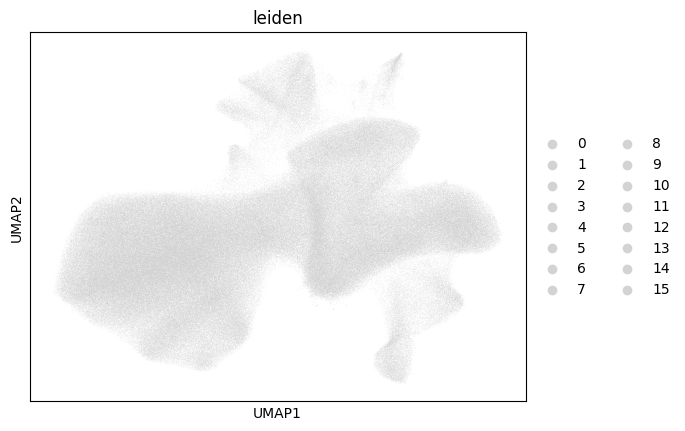

18


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


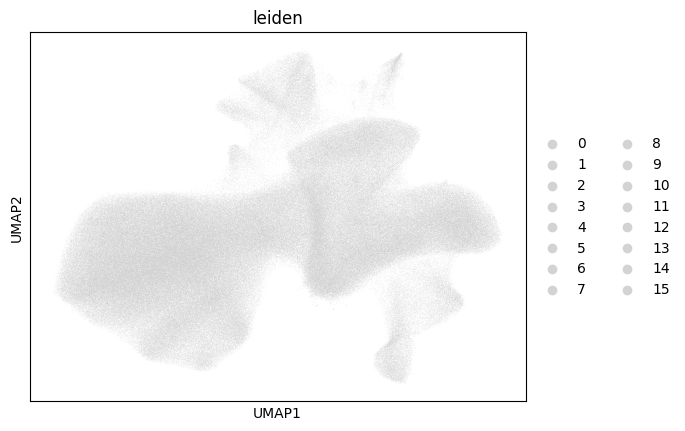

In [118]:
for i in range(0,19):
    print(i)
    # adata.uns['leiden_colors'] = {str(i): '#d3d3d3' for i in range(19)}
    adata.uns['leiden_colors'] = ['#d3d3d3']*19
    adata.uns['leiden_colors'][i] = adata.uns['leiden_colors_og'][i]
    
    # print(adata.uns['leiden_colors'])
    
    sc.pl.umap(adata, color = 'leiden')
    
    # if i == 2:
    #     break

In [119]:
# import seaborn as sns

In [120]:
# sns.palplot(sns.color_palette('Set2',31))

In [121]:
# color_labels = adata.obs['leiden'].unique()
# rgb_values = sns.color_palette('Set2',31)
# color_map = dict(zip(color_labels, rgb_values))


In [122]:
# adata.obs['leiden'].map(color_map)

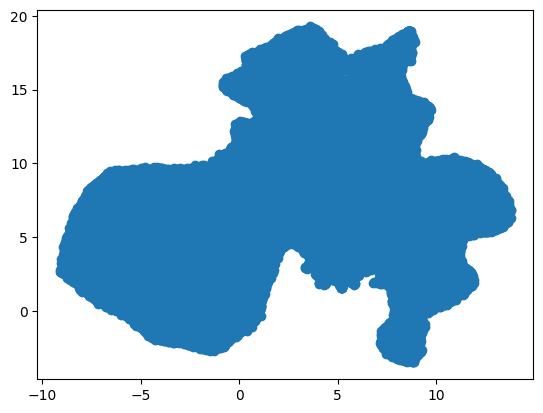

In [123]:
plt.scatter(x = [subarray[0] for subarray in adata.obsm['X_umap']],
            y = [subarray[1] for subarray in adata.obsm['X_umap']],
            # c = adata.obs['leiden'].map(color_map)
           )

Finding cluster marker genessc.tl.rank_genes_groups

In [124]:
# help(sc.tl.rank_genes_groups)

In [125]:
sc.tl.rank_genes_groups(adata, 'leiden', method = 'wilcoxon')

In [126]:
adata

AnnData object with n_obs × n_vars = 708978 × 500
    obs: 'Unnamed: 0', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'log2_volume', 'library_size', 'log2_library_size_floor_0.5', 'original_index', 'n_counts', 'leiden'
    var: 'counts', 'var', 'log10_counts', 'ligand', 'receptor', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'leiden_colors_og', 'rank_genes_groups'
    obsm: 'blank_genes', 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'log1p_cpm'
    obsp: 'distances', 'connectivities'

In [127]:
adata.uns['leiden']

{'params': {'resolution': 1, 'random_state': 0, 'n_iterations': -1}}

In [128]:
adata.uns['rank_genes_groups'].keys()

dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])

In [129]:
len(adata.uns['rank_genes_groups']['scores'][0])

16

In [130]:
len(adata.uns['rank_genes_groups']['scores'])

500

In [131]:
adata.uns['rank_genes_groups']['pvals_adj'][0]

(0., 0., 0., 0., 0., 0., 0., 1.44712104e-242, 0., 0., 0., 0., 0., 0., 0., 0.)

In [132]:
adata.uns['rank_genes_groups']['scores'][0]

(415.27728, 351.5479, 343.1953, 267.66922, 286.99304, 358.31183, 222.51123, 33.272274, 213.33759, 224.68016, 165.4859, 265.10242, 253.27963, 126.35053, 104.207664, 39.417202)

In [133]:
adata.uns['rank_genes_groups']['names'][0]

('FOXM1', 'EPHB3', 'FCGR3A', 'SPP1', 'MMP7', 'FN1', 'CR2', 'SPP1', 'COL1A1', 'CD40', 'PKM', 'TRAC', 'COL4A1', 'CD207', 'CD79A', 'KIT')

In [134]:
adata.uns['rank_genes_groups']['names'][0]

('FOXM1', 'EPHB3', 'FCGR3A', 'SPP1', 'MMP7', 'FN1', 'CR2', 'SPP1', 'COL1A1', 'CD40', 'PKM', 'TRAC', 'COL4A1', 'CD207', 'CD79A', 'KIT')

In [135]:
adata.uns['rank_genes_groups']['names'][0]

('FOXM1', 'EPHB3', 'FCGR3A', 'SPP1', 'MMP7', 'FN1', 'CR2', 'SPP1', 'COL1A1', 'CD40', 'PKM', 'TRAC', 'COL4A1', 'CD207', 'CD79A', 'KIT')

In [136]:
adata.uns['rank_genes_groups'].keys()

dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])

In [137]:
adata.uns['rank_genes_groups']['params']

{'groupby': 'leiden',
 'reference': 'rest',
 'method': 'wilcoxon',
 'use_raw': True,
 'layer': None,
 'corr_method': 'benjamini-hochberg'}

In [138]:
# [subarray[0] for subarray in adata.obsm['X_umap']]

In [139]:
gene_order_question = [subarray[0] for subarray in adata.uns['rank_genes_groups']['names']]

In [140]:
len(set(gene_order_question))

500

In [141]:
# help(sc.pl.rank_genes_groups_dotplot)

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


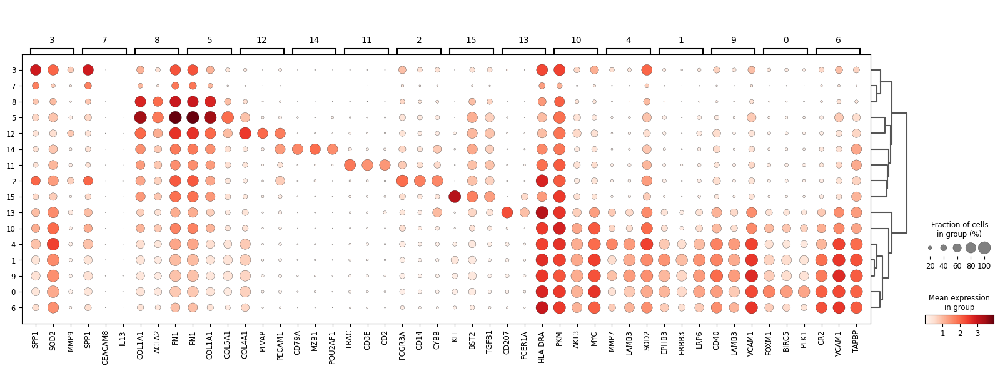

In [142]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=3)

In [143]:
adata.uns['rank_genes_groups']['names'][0]

('FOXM1', 'EPHB3', 'FCGR3A', 'SPP1', 'MMP7', 'FN1', 'CR2', 'SPP1', 'COL1A1', 'CD40', 'PKM', 'TRAC', 'COL4A1', 'CD207', 'CD79A', 'KIT')

In [144]:
len(set(adata.uns['rank_genes_groups']['names'][0]))

15

In [145]:
len((adata.uns['rank_genes_groups']['names'][0]))

16

In [146]:
adata.uns['leiden_colors'] = adata.uns['leiden_colors_og']

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


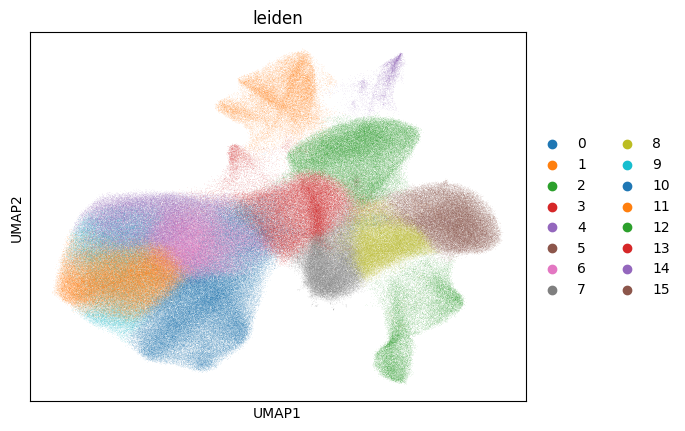

In [147]:
sc.pl.umap(adata, color = 'leiden')

In [148]:
adata

AnnData object with n_obs × n_vars = 708978 × 500
    obs: 'Unnamed: 0', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'log2_volume', 'library_size', 'log2_library_size_floor_0.5', 'original_index', 'n_counts', 'leiden'
    var: 'counts', 'var', 'log10_counts', 'ligand', 'receptor', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'leiden_colors_og', 'rank_genes_groups', 'dendrogram_leiden'
    obsm: 'blank_genes', 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'log1p_cpm'
    obsp: 'distances', 'connectivities'

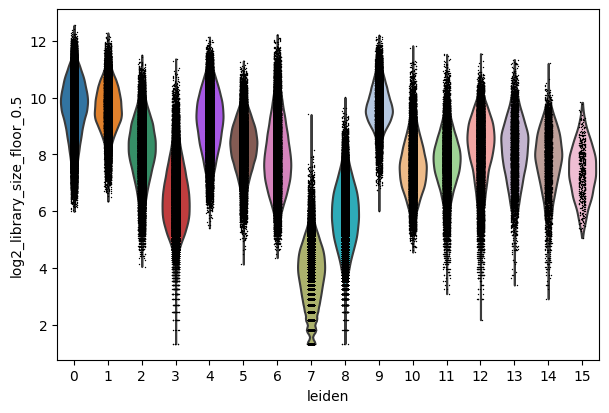

In [149]:
sc.pl.violin(adata, keys= 'log2_library_size_floor_0.5',groupby='leiden')

In [150]:
for i in lr_pairs[lr_pairs['pair_present'] == True]:
    print(i)

lr_pair
ligand_gene_symbol
receptor_gene_symbol
ligand_gene_id
receptor_gene_id
ligand_ensembl_protein_id
receptor_ensembl_protein_id
ligand_ensembl_gene_id
receptor_ensembl_gene_id
evidence
ligand_present
receptor_present
pair_present


In [151]:
lr_pairs_present = lr_pairs[lr_pairs['pair_present'] == True]

In [152]:
lr_pairs_present.shape

(278, 13)

In [153]:
lr_pairs_present.index[10]

120

Ligand: CX3CL1, and receptor: CX3CR1


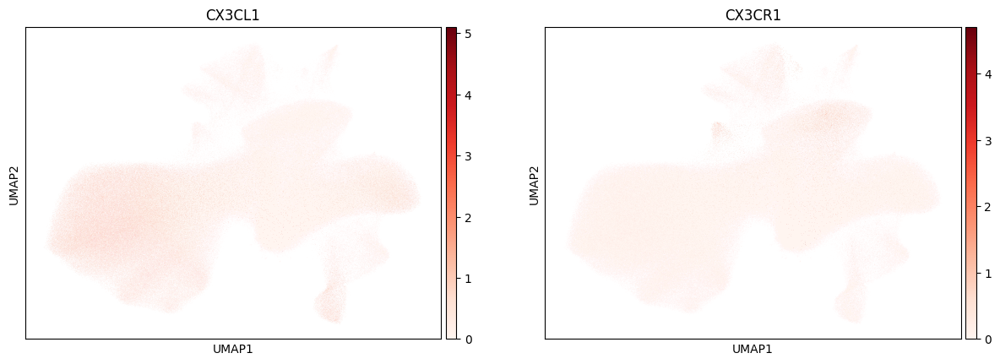

None


In [154]:
for index, row in lr_pairs_present.iterrows():
    # print(index)
    ligand = row['ligand_gene_symbol']
    receptor = row['receptor_gene_symbol']
    
    print(f"Ligand: {ligand}, and receptor: {receptor}")
    
    print(sc.pl.umap(adata, color= [ligand,receptor], cmap='Reds'))
    
    break
    if index == 120: break

In [155]:
print(ligand)
receptor

CX3CL1


'CX3CR1'

In [156]:
mtx = adata.to_df()

In [157]:
mtx[ligand]

0         1.370931
1        -0.488665
2         1.519919
3         1.473543
4        -0.488665
            ...   
713116   -0.488665
713117   -0.488665
713118    2.497377
713119    2.005901
713120   -0.488665
Name: CX3CL1, Length: 708978, dtype: float32

<function matplotlib.pyplot.show(close=None, block=None)>

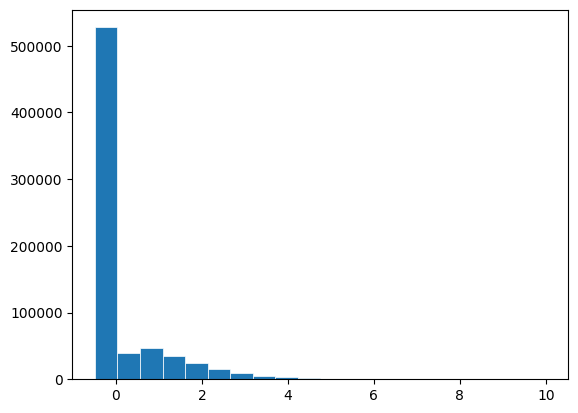

In [158]:
fig, ax = plt.subplots()

ax.hist(mtx[ligand], bins = 20, linewidth = 0.5, edgecolor= 'white')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

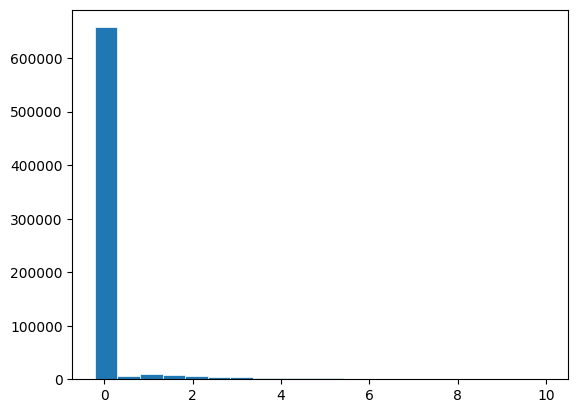

In [159]:
fig, ax = plt.subplots()

ax.hist(mtx[receptor], bins = 20, linewidth = 0.5, edgecolor= 'white')
plt.show

In [160]:
adata.obs['ligand'] = (mtx[ligand] > 0).astype(str).astype('category')

In [161]:
adata.obs['receptor'] = (mtx[receptor] > 0).astype(str).astype('category')

C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


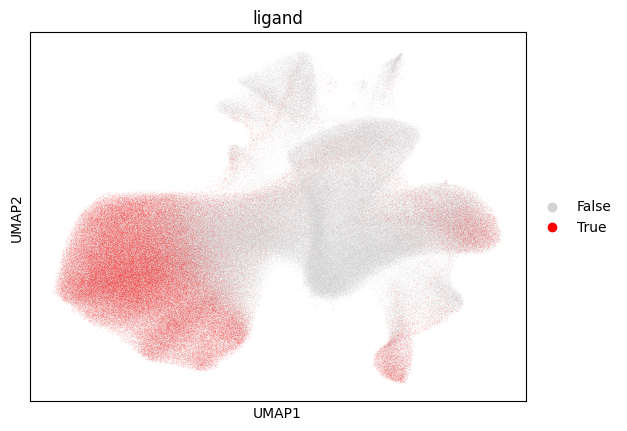

In [162]:
sc.pl.umap(adata, color = 'ligand', palette={'True': 'red',
                                             'False': 'lightgrey'})

In [163]:
mtx[receptor][index]

-0.21744597

In [164]:
index

4

In [165]:
receptor

'CX3CR1'

In [166]:
adata.obs['label'] = 0

In [167]:
adata.obs['label'] = np.where((mtx[ligand] > 0) & (mtx[receptor] >0), 'both',
                              np.where(mtx[ligand]>0, 'ligand',
                                       np.where(mtx[receptor] >0, 'receptor','none')))

In [168]:
Counter(adata.obs['label'])

Counter({'ligand': 163230, 'none': 494131, 'both': 19416, 'receptor': 32201})

C:\Users\DouglasHannumJr\Desktop\test_squidpy\test2\squidpy\squidpy\pl\_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


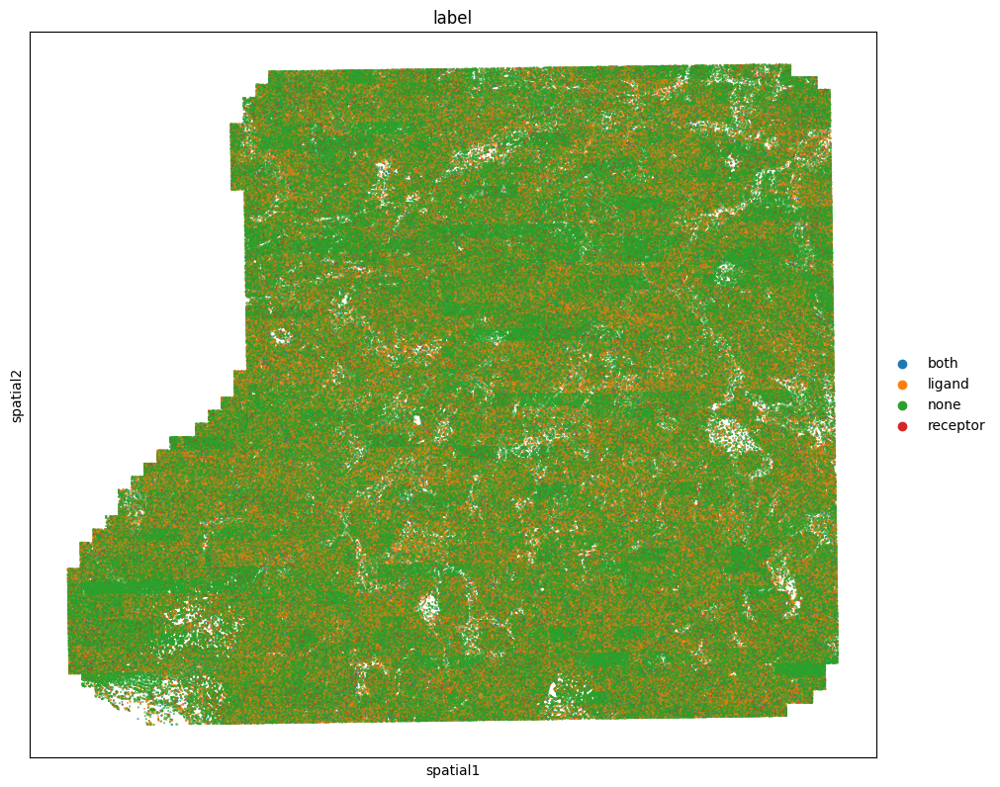

In [169]:
sq.pl.spatial_scatter(
    adata,
    shape=None,
    color="label",
    size=0.2,
    library_id='spatial',
    figsize=(10, 10)
)

C:\Users\DouglasHannumJr\Desktop\test_squidpy\test2\squidpy\squidpy\pl\_color_utils.py:26: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]
C:\Users\DouglasHannumJr\Desktop\test_squidpy\test2\squidpy\squidpy\pl\_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


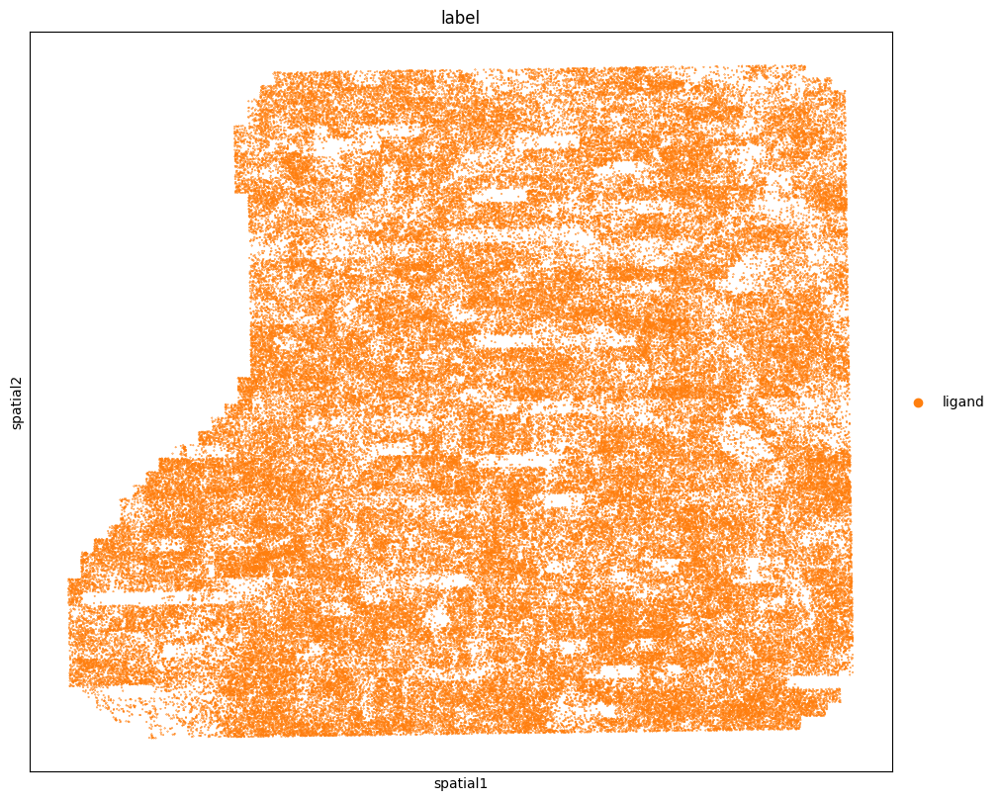

In [170]:
sq.pl.spatial_scatter(
    adata[adata.obs['label'] == 'ligand'],
    shape=None,
    color="label",
    size=0.2,
    library_id='spatial',
    figsize=(10, 10)
)

C:\Users\DouglasHannumJr\Desktop\test_squidpy\test2\squidpy\squidpy\pl\_color_utils.py:26: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]
C:\Users\DouglasHannumJr\Desktop\test_squidpy\test2\squidpy\squidpy\pl\_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


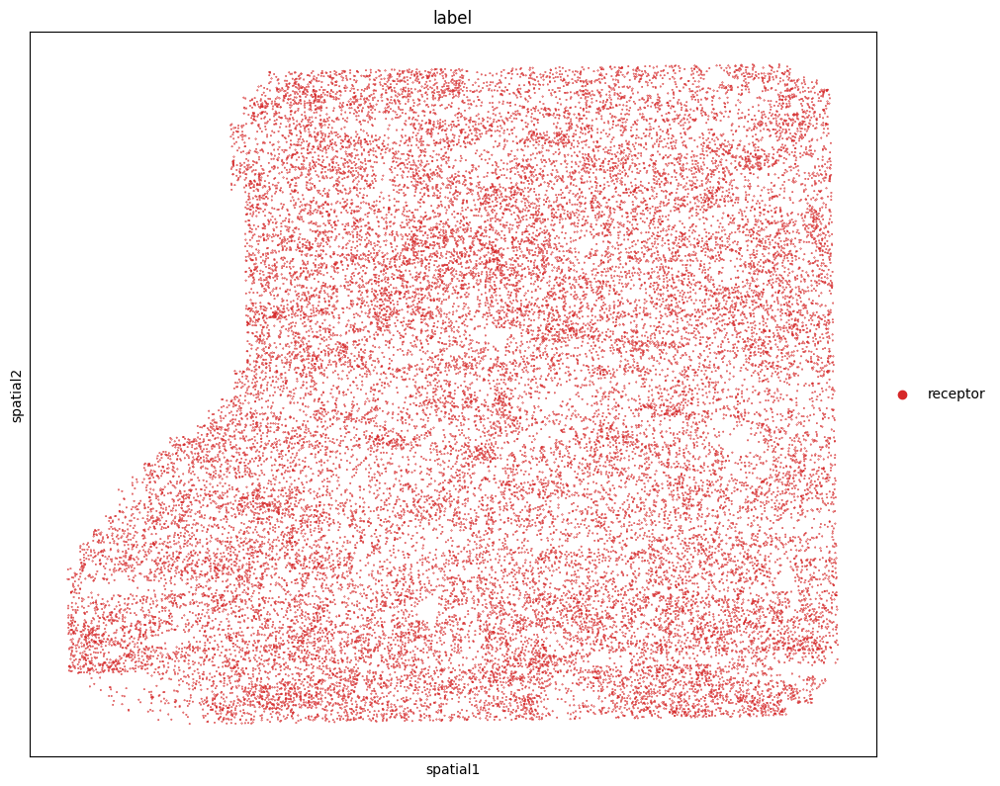

In [171]:
sq.pl.spatial_scatter(
    adata[adata.obs['label'] == 'receptor'],
    shape=None,
    color="label",
    size=0.2,
    library_id='spatial',
    figsize=(10, 10)
)

In [172]:
adata

AnnData object with n_obs × n_vars = 708978 × 500
    obs: 'Unnamed: 0', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'log2_volume', 'library_size', 'log2_library_size_floor_0.5', 'original_index', 'n_counts', 'leiden', 'ligand', 'receptor', 'label'
    var: 'counts', 'var', 'log10_counts', 'ligand', 'receptor', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'leiden_colors_og', 'rank_genes_groups', 'dendrogram_leiden', 'ligand_colors', 'label_colors'
    obsm: 'blank_genes', 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'log1p_cpm'
    obsp: 'distances', 'connectivities'

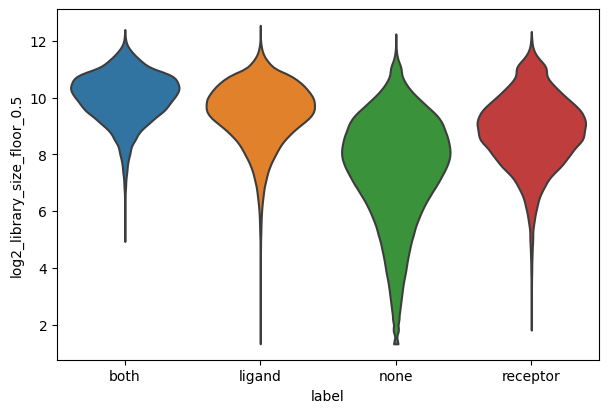

In [173]:
sc.pl.violin(adata,keys='log2_library_size_floor_0.5', groupby = 'label',size = 0)

Ligand: CX3CL1, and receptor: CX3CR1


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


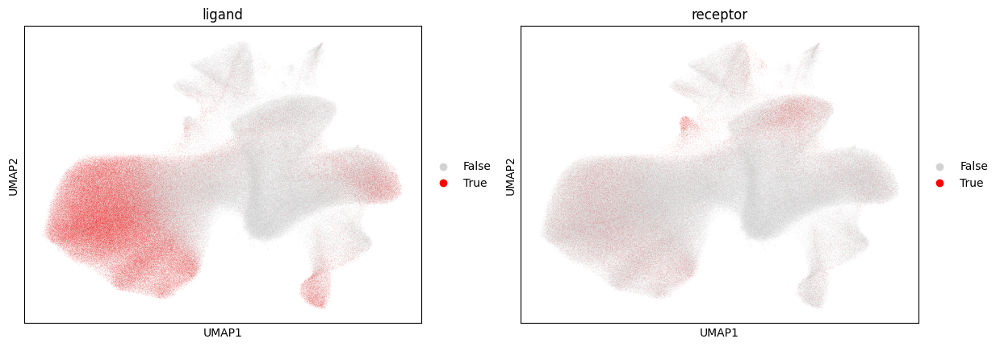

None


C:\Users\DouglasHannumJr\Desktop\test_squidpy\test2\squidpy\squidpy\pl\_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


None


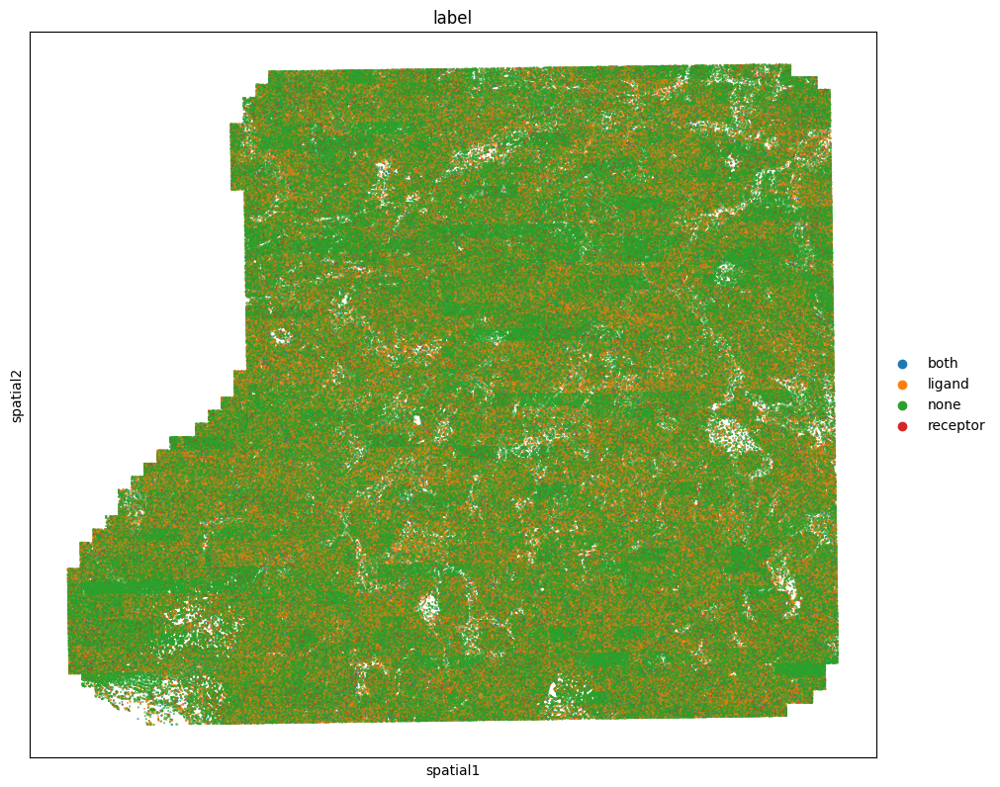

In [174]:
for index, row in lr_pairs_present.iterrows():
    # print(index)
    ligand = row['ligand_gene_symbol']
    receptor = row['receptor_gene_symbol']
    
    adata.obs['ligand'] = (mtx[ligand] > 0).astype('str').astype('category')
    adata.obs['receptor'] = (mtx[receptor] > 0).astype('str').astype('category')
    
    print(f"Ligand: {ligand}, and receptor: {receptor}")
    
    print(sc.pl.umap(adata, color= ['ligand','receptor'],
                     palette={'True': 'red',
                              'False': 'lightgrey'}))
    
    
    adata.obs['label'] = np.where((mtx[ligand] > 0) & (mtx[receptor] >0), 'both',
                              np.where(mtx[ligand]>0, 'ligand',
                                       np.where(mtx[receptor] >0, 'receptor','none')))
    
    print(sq.pl.spatial_scatter(
        adata,
        shape=None,
        color="label",
        size=0.2,
        library_id='spatial',
        figsize=(10, 10)
    ))
    break
    # if index > 20: break

In [175]:
adata.obs.describe()

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,log2_volume,library_size,log2_library_size_floor_0.5,original_index,n_counts
count,708978.000000,708978.000000,708978.000000,708978.000000,708978.000000,708978.000000,708978.000000,708978.000000,708978.000000,708978.000000,708978.000000,708978.000000,708978.000000,708978.000000
mean,356579.177958,1286.098995,750.158686,6590.589465,5319.065845,6585.116184,6596.062747,5313.693457,5324.438232,9.190348,498.676718,8.045474,356543.928891,498.676697
std,205875.557877,730.295872,553.186131,3039.564782,2931.606454,3039.493002,3039.638419,2931.528948,2931.685709,1.039931,516.462523,1.916567,205820.764211,516.410645
min,0.000000,0.000000,104.975899,-35.933027,-212.468829,-37.799486,-34.290847,-215.639293,-210.671033,6.713914,2.000000,1.321928,0.000000,2.000000
25%,178286.250000,655.000000,350.250398,4066.539818,2790.908838,4061.173627,4071.973366,2786.166588,2795.681585,8.452243,125.000000,6.971544,178629.250000,125.000000
50%,356477.500000,1305.000000,590.616894,6631.455311,5635.930778,6625.601970,6637.453030,5630.412827,5641.322522,9.206079,327.000000,8.355351,356481.500000,327.000000
75%,534830.750000,1937.000000,993.708582,9175.489407,7935.386710,9169.736809,9181.065417,7929.987567,7940.716355,9.956679,702.000000,9.456354,534933.750000,702.000000
max,713120.000000,2506.000000,6148.186858,11888.795939,10017.212486,11886.311577,11892.753821,10015.700243,10019.159384,12.585945,6005.000000,12.552069,713120.000000,6005.000000


In [176]:
sub = adata[(adata.obs['center_x'] > 5000) & (adata.obs['center_x'] < 6000) &
            (adata.obs['center_y'] > 5000) & (adata.obs['center_y'] < 6000)]

C:\Users\DouglasHannumJr\Desktop\test_squidpy\test2\squidpy\squidpy\pl\_color_utils.py:26: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]
C:\Users\DouglasHannumJr\Desktop\test_squidpy\test2\squidpy\squidpy\pl\_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


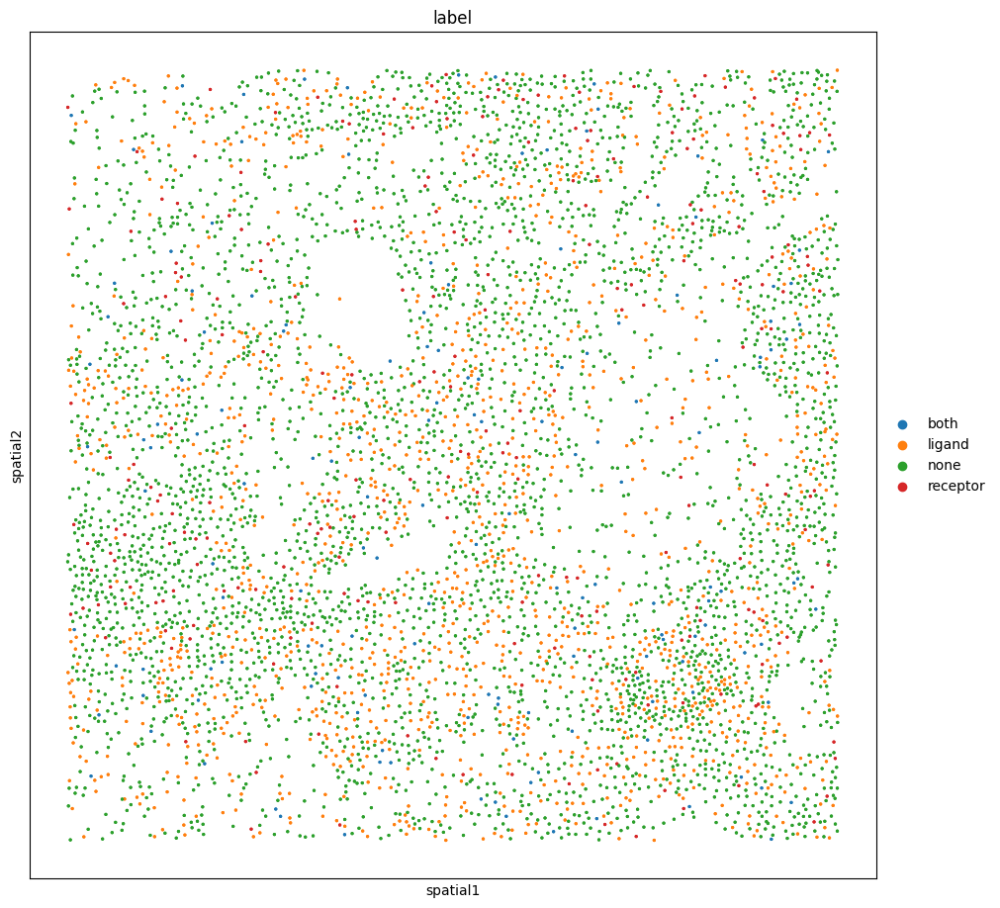

In [177]:
sq.pl.spatial_scatter(
    sub,
    shape=None,
    color="label",
    size=7,
    library_id='spatial',
    figsize=(10, 10)
)

Ligand: CX3CL1, and receptor: CX3CR1


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


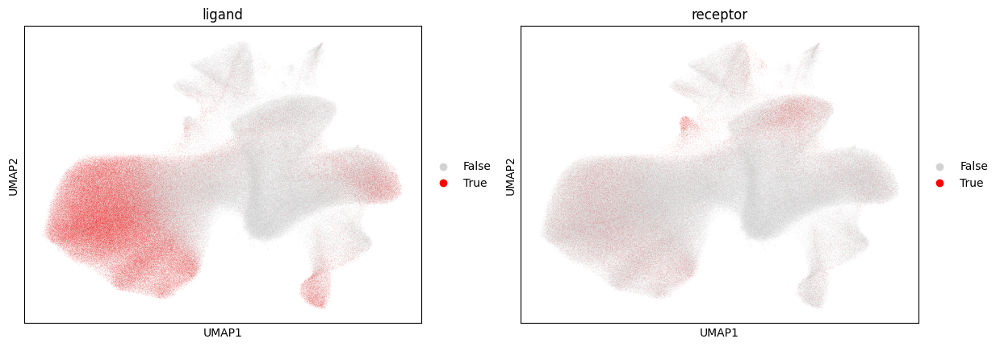

None


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\anndata\_core\anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\DouglasHannumJr\Desktop\test_squidpy\test2\squidpy\squidpy\pl\_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


None
Ligand: ICAM3, and receptor: ITGB2


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


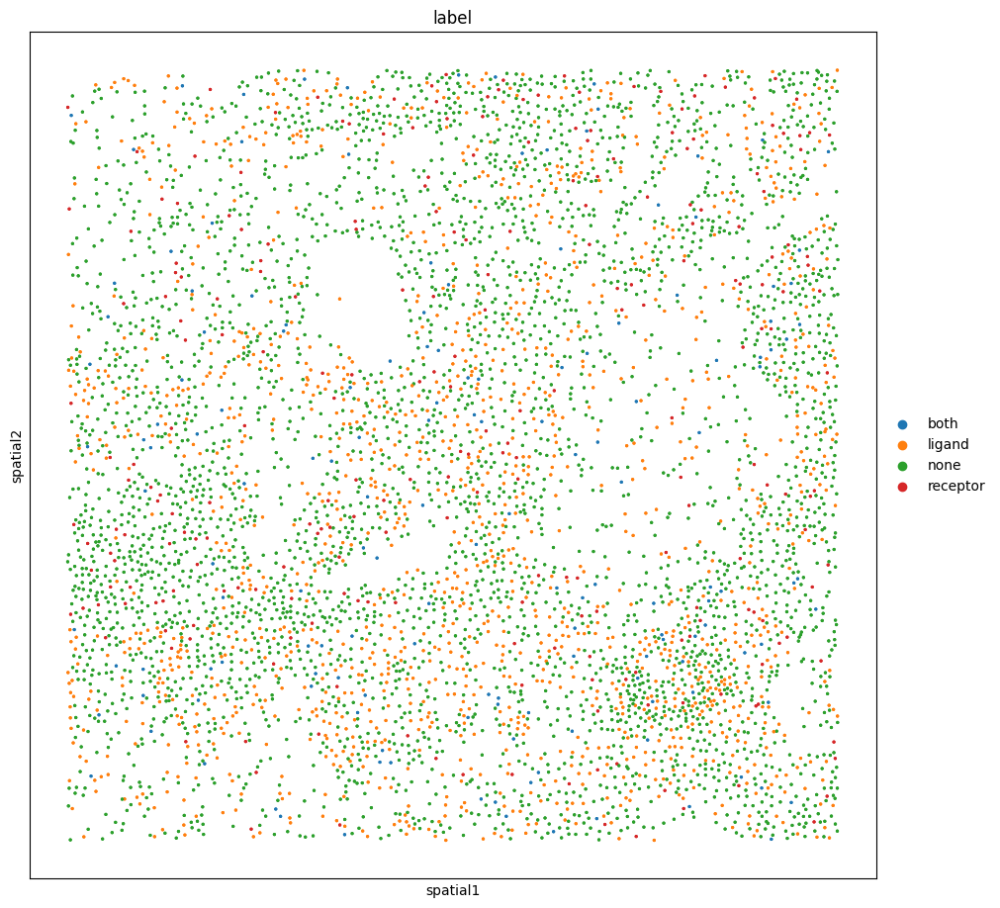

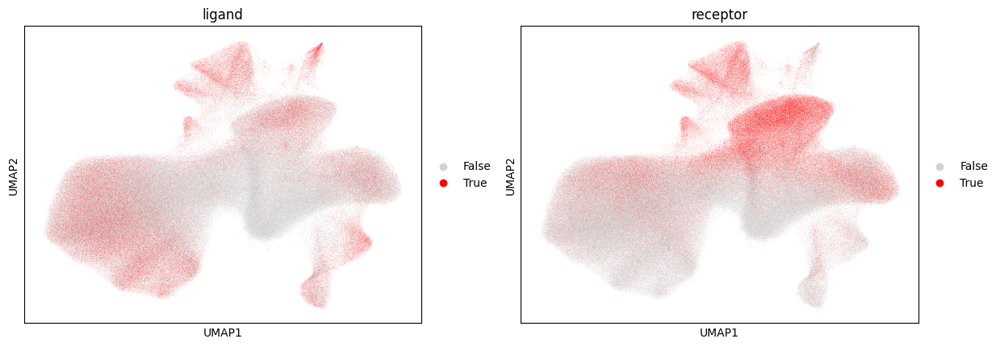

None


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\anndata\_core\anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\DouglasHannumJr\Desktop\test_squidpy\test2\squidpy\squidpy\pl\_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


None
Ligand: ICAM3, and receptor: CD209


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


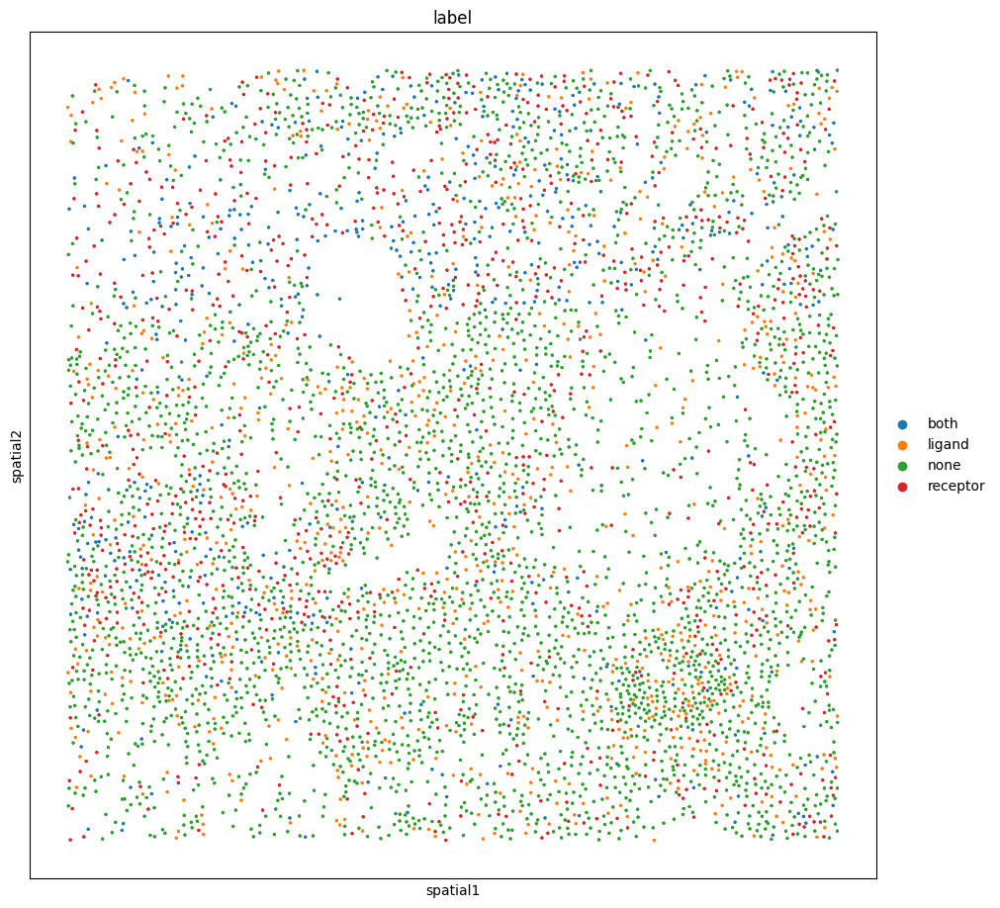

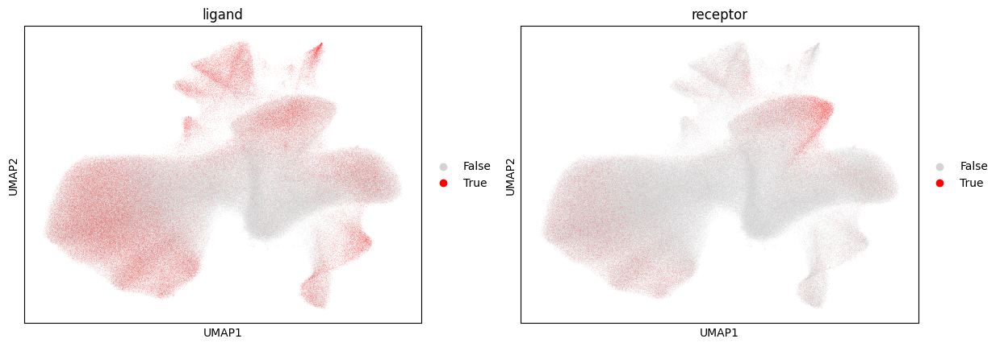

None


C:\Users\DouglasHannumJr\anaconda3\lib\site-packages\anndata\_core\anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\DouglasHannumJr\Desktop\test_squidpy\test2\squidpy\squidpy\pl\_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


None


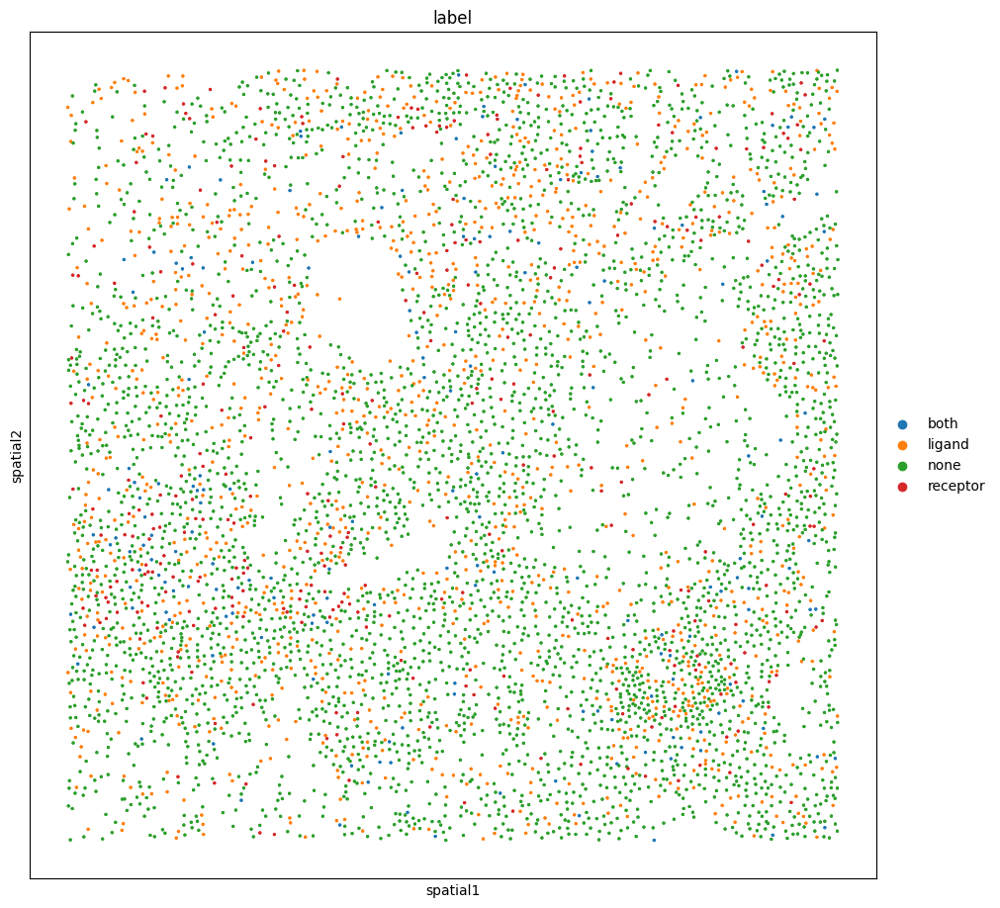

In [178]:
for index, row in lr_pairs_present.iterrows():
    # print(index)
    ligand = row['ligand_gene_symbol']
    receptor = row['receptor_gene_symbol']
    
    adata.obs['ligand'] = (mtx[ligand] > 0).astype('str').astype('category')
    adata.obs['receptor'] = (mtx[receptor] > 0).astype('str').astype('category')
    
    print(f"Ligand: {ligand}, and receptor: {receptor}")
    
    print(sc.pl.umap(adata, color= ['ligand','receptor'],
                     palette={'True': 'red',
                              'False': 'lightgrey'}))
    
    
    adata.obs['label'] = np.where((mtx[ligand] > 0) & (mtx[receptor] >0), 'both',
                              np.where(mtx[ligand]>0, 'ligand',
                                       np.where(mtx[receptor] >0, 'receptor','none')))
    
    sub = adata[(adata.obs['center_x'] > 5000) & (adata.obs['center_x'] < 6000) &
            (adata.obs['center_y'] > 5000) & (adata.obs['center_y'] < 6000)]
    
    print(sq.pl.spatial_scatter(
        sub,
        shape=None,
        color="label",
        size=7,
        library_id='spatial',
        figsize=(10, 10)
    ))
    # break
    if index > 20: break

In [179]:
import pickle

In [180]:
with open('../data/mouse_brain_showcase/scanpy_object.pickle','wb') as f:
    pickle.dump(adata,f)

In [181]:
with open('../data/mouse_brain_showcase/lr_pairs.pickle','wb') as f:
    pickle.dump(lr_pairs_present,f)